In [ ]:
from fastai.vision.all import *


In [ ]:
data_path = Path('/kaggle/input/defungi')

images = get_image_files(data_path)
print(f"No. of images: {len(images)}")


In [ ]:
# ensure all images are 500x500px
sizes = set(Image.open(img).size for img in images)
print("Image Dimensions:", *sizes)


In [ ]:
# preview a random image from each class
images = []
target = []
counts = []
for path in data_path.ls().sorted():
    target.append(path.name) # class name is name of parent folder

    class_images = get_image_files(path)
    counts.append(len(class_images))

    img = random.choice(class_images)
    images.append(Image.open(img))

show_images(images, titles=target)


In [ ]:


# distribution of classes
plt.bar(target, counts, width=1, edgecolor='black', alpha=0.9)
plt.xlabel('Class')
plt.ylabel('Count')


labels = [parent_label(img) for img in get_image_files(data_path)]
splitter = TrainTestSplitter(test_size=0.2, random_state=42, stratify=labels)

batch_transforms = aug_transforms(size=224, p_affine=0, max_warp=0, flip_vert=True)


dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=splitter,
    get_y=parent_label,
#     item_tfms=item_transforms,
    batch_tfms=batch_transforms
)
dls = dblock.dataloaders(data_path, batch_size=32)



# check distributions of train and validation set
from collections import Counter

train_labels = sorted(parent_label(x) for x in dls.train.items)
valid_labels = sorted(parent_label(x) for x in dls.valid.items)
ntrain = list(Counter(train_labels).values())
nvalid = list(Counter(valid_labels).values())

ax = plt.subplots()[1]
ax.bar(target, nvalid, width=1, edgecolor='black', alpha=0.9, label='valid')
ax.bar(target, ntrain, width=1, edgecolor='black', alpha=0.9, label='train', bottom=nvalid)
plt.xlabel('Class')
plt.ylabel('Count')
plt.legend()




dls.show_batch(max_n=6, nrows=2)
dls.show_batch(max_n=3, nrows=1, unique=True)

learn = vision_learner(dls, resnet34, metrics=[error_rate, accuracy])
learn.loss_func



learn.lr_find()
learn.fine_tune(12, 0.002)

learn.recorder.plot_loss()
learn.show_results(max_n=6, nrows=2)



interp = Interpretation.from_learner(learn)
interp.plot_top_losses(4)




In [ ]:


# show confusion matrix of predictions on the validation set
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix(normalize=True)



In [ ]:
#Test model 1
from fastai.vision.all import *
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt
from collections import Counter

# Load and prepare the dataset
data_path = Path('/kaggle/input/defungi')
images = get_image_files(data_path)
print(f"No. of images: {len(images)}")

# Print image dimensions
sizes = set(Image.open(img).size for img in images)
print("Image Dimensions:", *sizes)

# Visualize some images
images = []
target = []
counts = []
for path in data_path.ls().sorted():
    target.append(path.name)  # class name is name of parent folder
    class_images = get_image_files(path)
    counts.append(len(class_images))
    img = random.choice(class_images)
    images.append(Image.open(img))

show_images(images, titles=target)

# Bar chart for class distribution
plt.figure(figsize=(10, 5))
plt.bar(target, counts, width=1, edgecolor='black', alpha=0.9)
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Class Distribution')
plt.show()

# Create data loaders
labels = [parent_label(img) for img in get_image_files(data_path)]
splitter = TrainTestSplitter(test_size=0.2, random_state=42, stratify=labels)

batch_transforms = aug_transforms(size=224, p_affine=0, max_warp=0, flip_vert=True)

dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=splitter,
    get_y=parent_label,
    batch_tfms=batch_transforms
)
dls = dblock.dataloaders(data_path, batch_size=32)

# Check distributions of train and validation set
train_labels = sorted(parent_label(x) for x in dls.train.items)
valid_labels = sorted(parent_label(x) for x in dls.valid.items)
ntrain = list(Counter(train_labels).values())
nvalid = list(Counter(valid_labels).values())

plt.figure(figsize=(10, 5))
ax = plt.subplots()[1]
ax.bar(target, nvalid, width=1, edgecolor='black', alpha=0.9, label='valid')
ax.bar(target, ntrain, width=1, edgecolor='black', alpha=0.9, label='train', bottom=nvalid)
plt.xlabel('Class')
plt.ylabel('Count')
plt.legend()
plt.title('Train and Validation Set Distribution')
plt.show()

# Show batch of images
dls.show_batch(max_n=6, nrows=2)
dls.show_batch(max_n=3, nrows=1, unique=True)

# Create and train the model with ResNet34
learn = vision_learner(dls, resnet34, metrics=[error_rate, accuracy])
learn.loss_func

# Find learning rate and fine-tune the model
learn.lr_find()
learn.fine_tune(32, 0.002)

# Plot learning curve
learn.recorder.plot_loss()
plt.title('Learning Curve')
plt.show()

# Show results
learn.show_results(max_n=6, nrows=2)

# Plot top losses
interp = Interpretation.from_learner(learn)
interp.plot_top_losses(4)

# Show confusion matrix of predictions on the validation set
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix(normalize=True)


# Generate classification report
preds, y_true = learn.get_preds() # Get predictions and true labels on the validation set
y_pred = preds.argmax(dim=1).numpy() # Convert predictions to numpy array
y_true = y_true.numpy() # Convert true labels to numpy array

# Convert indices to class labels
y_pred_labels = [dls.vocab[idx] for idx in y_pred]
y_true_labels = [dls.vocab[idx] for idx in y_true]

report = classification_report(y_true_labels, y_pred_labels, target_names=dls.vocab)
print(report)


In [ ]:
#Test model 2
from fastai.vision.all import *
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt
from collections import Counter

# Load and prepare the dataset
data_path = Path('/kaggle/input/defungi')
images = get_image_files(data_path)
print(f"No. of images: {len(images)}")

# Print image dimensions
sizes = set(Image.open(img).size for img in images)
print("Image Dimensions:", *sizes)

# Visualize some images
images = []
target = []
counts = []
for path in data_path.ls().sorted():
    target.append(path.name)  # class name is name of parent folder
    class_images = get_image_files(path)
    counts.append(len(class_images))
    img = random.choice(class_images)
    images.append(Image.open(img))

show_images(images, titles=target)

# Bar chart for class distribution
plt.figure(figsize=(10, 5))
plt.bar(target, counts, width=1, edgecolor='black', alpha=0.9)
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Class Distribution')
plt.show()


labels = [parent_label(img) for img in get_image_files(data_path)]
splitter = TrainTestSplitter(test_size=0.2, random_state=42, stratify=labels)

batch_transforms = aug_transforms(size=224, p_affine=0, max_warp=0, flip_vert=True)

dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=splitter,
    get_y=parent_label,
    batch_tfms=batch_transforms
)
dls = dblock.dataloaders(data_path, batch_size=32)

train_labels = sorted(parent_label(x) for x in dls.train.items)
valid_labels = sorted(parent_label(x) for x in dls.valid.items)
ntrain = list(Counter(train_labels).values())
nvalid = list(Counter(valid_labels).values())

plt.figure(figsize=(10, 5))
ax = plt.subplots()[1]
ax.bar(target, nvalid, width=1, edgecolor='black', alpha=0.9, label='valid')
ax.bar(target, ntrain, width=1, edgecolor='black', alpha=0.9, label='train', bottom=nvalid)
plt.xlabel('Class')
plt.ylabel('Count')
plt.legend()
plt.title('Train and Validation Set Distribution')
plt.show()

# Show batch of images
dls.show_batch(max_n=6, nrows=2)
dls.show_batch(max_n=3, nrows=1, unique=True)


from fastai.callback.hook import num_features_model
from sklearn.svm import SVC

# Define a custom head for the model
def create_head(num_features, num_classes, ps=0.5):
    return nn.Sequential(
        nn.AdaptiveAvgPool2d(1),
        nn.Flatten(),
        nn.Linear(num_features, 512),
        nn.ReLU(inplace=True),
        nn.BatchNorm1d(512),
        nn.Dropout(ps),
        nn.Linear(512, num_classes)
    )

# Get the number of features in the pre-trained model
num_features = num_features_model(efficientnet_b0)

# Create a learner with the custom head
learn = vision_learner(dls,resnet34,
                       metrics=[error_rate, accuracy],
                       custom_head=create_head(num_features, dls.c))

# Find learning rate and fine-tune the model
learn.lr_find()
learn.fine_tune(12, 0.002)

# Plot learning curve
learn.recorder.plot_loss()
plt.title('Learning Curve')
plt.show()

# Show results
learn.show_results(max_n=6, nrows=2)

# Plot top losses
interp = Interpretation.from_learner(learn)
interp.plot_top_losses(4)

# Show confusion matrix of predictions on the validation set
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix(normalize=True)


preds, y_true = learn.get_preds() # Get predictions and true labels on the validation set
y_pred = preds.argmax(dim=1).numpy() # Convert predictions to numpy array
y_true = y_true.numpy() # Convert true labels to numpy array

# Convert indices to class labels
y_pred_labels = [dls.vocab[idx] for idx in y_pred]
y_true_labels = [dls.vocab[idx] for idx in y_true]

report = classification_report(y_true_labels, y_pred_labels, target_names=dls.vocab)
print(report)





In [ ]:
# Test model 3 --grad-Cam
from fastai.vision.all import *
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt
from collections import Counter
import torch
import cv2
import numpy as np

# Load and prepare the dataset
data_path = Path('/kaggle/input/defungi')
images = get_image_files(data_path)
print(f"No. of images: {len(images)}")

# Print image dimensions
sizes = set(Image.open(img).size for img in images)
print("Image Dimensions:", *sizes)

# Visualize some images
images = []
target = []
counts = []
for path in data_path.ls().sorted():
    target.append(path.name)  # class name is name of parent folder
    class_images = get_image_files(path)
    counts.append(len(class_images))
    img = random.choice(class_images)
    images.append(Image.open(img))

show_images(images, titles=target)

# Bar chart for class distribution
plt.figure(figsize=(10, 5))
plt.bar(target, counts, width=1, edgecolor='black', alpha=0.9)
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Class Distribution')
plt.show()

# Create data loaders
labels = [parent_label(img) for img in get_image_files(data_path)]
splitter = TrainTestSplitter(test_size=0.2, random_state=42, stratify=labels)

batch_transforms = aug_transforms(size=224, p_affine=0, max_warp=0, flip_vert=True)

dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=splitter,
    get_y=parent_label,
    batch_tfms=batch_transforms
)
dls = dblock.dataloaders(data_path, batch_size=32)

# Check distributions of train and validation set
train_labels = sorted(parent_label(x) for x in dls.train.items)
valid_labels = sorted(parent_label(x) for x in dls.valid.items)
ntrain = list(Counter(train_labels).values())
nvalid = list(Counter(valid_labels).values())

plt.figure(figsize=(10, 5))
ax = plt.subplots()[1]
ax.bar(target, nvalid, width=1, edgecolor='black', alpha=0.9, label='valid')
ax.bar(target, ntrain, width=1, edgecolor='black', alpha=0.9, label='train', bottom=nvalid)
plt.xlabel('Class')
plt.ylabel('Count')
plt.legend()
plt.title('Train and Validation Set Distribution')
plt.show()

# Show batch of images
dls.show_batch(max_n=6, nrows=2)
dls.show_batch(max_n=3, nrows=1, unique=True)

# Create and train the model with ResNet34
learn = vision_learner(dls, resnet34, metrics=[error_rate, accuracy])
learn.loss_func

# Find learning rate and fine-tune the model
learn.lr_find()
learn.fine_tune(2, 0.002)

# Plot learning curve
learn.recorder.plot_loss()
plt.title('Learning Curve')
plt.show()

# Show results
learn.show_results(max_n=6, nrows=2)

# Plot top losses
interp = Interpretation.from_learner(learn)
interp.plot_top_losses(4)

# Show confusion matrix of predictions on the validation set
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix(normalize=True)

# Generate classification report
preds, y_true = learn.get_preds() # Get predictions and true labels on the validation set
y_pred = preds.argmax(dim=1).numpy() # Convert predictions to numpy array
y_true = y_true.numpy() # Convert true labels to numpy array

# Convert indices to class labels
y_pred_labels = [dls.vocab[idx] for idx in y_pred]
y_true_labels = [dls.vocab[idx] for idx in y_true]

report = classification_report(y_true_labels, y_pred_labels, target_names=dls.vocab)
print(report)

# Grad-CAM implementation
def generate_gradcam(learn, img, cls_idx):
    learn.model.eval()
    img = img.unsqueeze(0).to(next(learn.model.parameters()).device)  # Ensure image tensor is on the same device as model

    def hooked_backward(mod, grad_in, grad_out):
        global activations
        activations = grad_out[0]
    
    def hooked_forward(mod, input, output):
        global hook_a
        hook_a = output
    
    # Register hooks on the last convolutional layer
    for module in learn.model[0]:
        if isinstance(module, torch.nn.modules.conv.Conv2d):
            hook = module.register_forward_hook(hooked_forward)
            grad = module.register_backward_hook(hooked_backward)
    
    learn.model.zero_grad()
    out = learn.model(img)
    out[0, cls_idx].backward()

    weights = activations.mean(dim=[1, 2], keepdim=True)
    gradcam = (hook_a * weights).sum(0)
    gradcam = torch.clamp(gradcam, min=0)
    gradcam /= gradcam.max()
    gradcam = gradcam.detach().cpu().numpy()

    grad.remove()
    hook.remove()

    return gradcam

# Test Grad-CAM on validation set images
img, label = dls.valid_ds[0]
img_tensor = tensor(img).float()  # Convert PIL image to PyTorch tensor
img_tensor = img_tensor.permute(2, 0, 1)  # Permute dimensions to match expected input shape
cls_idx = int(label)
gradcam = generate_gradcam(learn, img_tensor.cuda(), cls_idx)

# Resize Grad-CAM heatmap to match image dimensions
heatmap_resized = cv2.resize(gradcam, (img_tensor.shape[1], img_tensor.shape[2]))

# Normalize the heatmap
heatmap_resized = np.uint8(255 * heatmap_resized)

# Ensure heatmap is 2D
if len(heatmap_resized.shape) == 3:
    heatmap_resized = heatmap_resized[:,:,0]

# Apply the color map
heatmap_resized = cv2.applyColorMap(heatmap_resized, cv2.COLORMAP_JET)

# Convert PIL image to numpy array
img = np.array(img)

# Ensure the heatmap and the image have the same number of channels
if img.shape[2] == 4:  # If image is RGBA
    img = cv2.cvtColor(img, cv2.COLOR_RGBA2RGB)

# Overlay heatmap on image
overlay = cv2.addWeighted(img, 0.6, heatmap_resized, 0.4, 0)

# Display Grad-CAM
plt.figure(figsize=(10, 5))
plt.imshow(overlay)
plt.title(f'Grad-CAM for {dls.vocab[cls_idx]}')
plt.show()


In [ ]:
# Test model 4- GradCam for 10 images

# Test model 1
from fastai.vision.all import *
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt
from collections import Counter
import torch
import cv2
import numpy as np

# Load and prepare the dataset
data_path = Path('/kaggle/input/defungi')
images = get_image_files(data_path)
print(f"No. of images: {len(images)}")

# Print image dimensions
sizes = set(Image.open(img).size for img in images)
print("Image Dimensions:", *sizes)

# Visualize some images
images = []
target = []
counts = []
for path in data_path.ls().sorted():
    target.append(path.name)  # class name is name of parent folder
    class_images = get_image_files(path)
    counts.append(len(class_images))
    img = random.choice(class_images)
    images.append(Image.open(img))

show_images(images, titles=target)

# Bar chart for class distribution
plt.figure(figsize=(10, 5))
plt.bar(target, counts, width=1, edgecolor='black', alpha=0.9)
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Class Distribution')
plt.show()

# Create data loaders
labels = [parent_label(img) for img in get_image_files(data_path)]
splitter = TrainTestSplitter(test_size=0.2, random_state=42, stratify=labels)

batch_transforms = aug_transforms(size=224, p_affine=0, max_warp=0, flip_vert=True)

dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=splitter,
    get_y=parent_label,
    batch_tfms=batch_transforms
)
dls = dblock.dataloaders(data_path, batch_size=32)

# Check distributions of train and validation set
train_labels = sorted(parent_label(x) for x in dls.train.items)
valid_labels = sorted(parent_label(x) for x in dls.valid.items)
ntrain = list(Counter(train_labels).values())
nvalid = list(Counter(valid_labels).values())

plt.figure(figsize=(10, 5))
ax = plt.subplots()[1]
ax.bar(target, nvalid, width=1, edgecolor='black', alpha=0.9, label='valid')
ax.bar(target, ntrain, width=1, edgecolor='black', alpha=0.9, label='train', bottom=nvalid)
plt.xlabel('Class')
plt.ylabel('Count')
plt.legend()
plt.title('Train and Validation Set Distribution')
plt.show()

# Show batch of images
dls.show_batch(max_n=6, nrows=2)
dls.show_batch(max_n=3, nrows=1, unique=True)

# Create and train the model with ResNet34
learn = vision_learner(dls, resnet34, metrics=[error_rate, accuracy])
learn.loss_func

# Find learning rate and fine-tune the model
learn.lr_find()
learn.fine_tune(2, 0.002)

# Plot learning curve
learn.recorder.plot_loss()
plt.title('Learning Curve')
plt.show()

# Show results
learn.show_results(max_n=6, nrows=2)

# Plot top losses
interp = Interpretation.from_learner(learn)
interp.plot_top_losses(4)

# Show confusion matrix of predictions on the validation set
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix(normalize=True)

# Generate classification report
preds, y_true = learn.get_preds() # Get predictions and true labels on the validation set
y_pred = preds.argmax(dim=1).numpy() # Convert predictions to numpy array
y_true = y_true.numpy() # Convert true labels to numpy array

# Convert indices to class labels
y_pred_labels = [dls.vocab[idx] for idx in y_pred]
y_true_labels = [dls.vocab[idx] for idx in y_true]

report = classification_report(y_true_labels, y_pred_labels, target_names=dls.vocab)
print(report)

# Grad-CAM implementation
def generate_gradcam(learn, img, cls_idx):
    learn.model.eval()
    img = img.unsqueeze(0).to(next(learn.model.parameters()).device)  # Ensure image tensor is on the same device as model

    def hooked_backward(mod, grad_in, grad_out):
        global activations
        activations = grad_out[0]
    
    def hooked_forward(mod, input, output):
        global hook_a
        hook_a = output
    
    # Register hooks on the last convolutional layer
    for module in learn.model[0]:
        if isinstance(module, torch.nn.modules.conv.Conv2d):
            hook = module.register_forward_hook(hooked_forward)
            grad = module.register_backward_hook(hooked_backward)
    
    learn.model.zero_grad()
    out = learn.model(img)
    out[0, cls_idx].backward()

    weights = activations.mean(dim=[1, 2], keepdim=True)
    gradcam = (hook_a * weights).sum(0)
    gradcam = torch.clamp(gradcam, min=0)
    gradcam /= gradcam.max()
    gradcam = gradcam.detach().cpu().numpy()

    grad.remove()
    hook.remove()

    return gradcam

# Test Grad-CAM on at least one image from each category in the validation set
plt.figure(figsize=(20, 10))
categories_seen = set()
n_categories = len(dls.vocab)
i = 0

for img, label in dls.valid_ds:
    cls_idx = int(label)
    if cls_idx not in categories_seen:
        img_tensor = tensor(img).float()  # Convert PIL image to PyTorch tensor
        img_tensor = img_tensor.permute(2, 0, 1)  # Permute dimensions to match expected input shape
        gradcam = generate_gradcam(learn, img_tensor.cuda(), cls_idx)

        # Resize Grad-CAM heatmap to match image dimensions
        heatmap_resized = cv2.resize(gradcam, (img_tensor.shape[1], img_tensor.shape[2]))

        # Normalize the heatmap
        heatmap_resized = np.uint8(255 * heatmap_resized)

        # Ensure heatmap is 2D
        if len(heatmap_resized.shape) == 3:
            heatmap_resized = heatmap_resized[:,:,0]

        # Apply the color map
        heatmap_resized = cv2.applyColorMap(heatmap_resized, cv2.COLORMAP_JET)

        # Convert PIL image to numpy array
        img = np.array(img)

        # Ensure the heatmap and the image have the same number of channels
        if img.shape[2] == 4:  # If image is RGBA
            img = cv2.cvtColor(img, cv2.COLOR_RGBA2RGB)

        # Overlay heatmap on image
        overlay = cv2.addWeighted(img, 0.6, heatmap_resized, 0.4, 0)

        # Display Grad-CAM
        plt.subplot(2, 5, i+1)
        plt.imshow(overlay)
        plt.title(f'Grad-CAM for {dls.vocab[cls_idx]}')
        plt.axis('off')
        
        categories_seen.add(cls_idx)
        i += 1
        
        if len(categories_seen) >= n_categories:
            break

plt.tight_layout()
plt.show()


In [ ]:
# Install necessary libraries
!pip install captum lime shap

from fastai.vision.all import *
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt
from collections import Counter
import torch
import cv2
import numpy as np
import lime
from lime import lime_image
import shap
import torch
import torchvision.transforms as transforms
from captum.attr import Saliency, IntegratedGradients, visualization as viz
from skimage.segmentation import mark_boundaries
import torchvision.transforms as T

# Load and prepare the dataset
data_path = Path('/kaggle/input/defungi')
images = get_image_files(data_path)
print(f"No. of images: {len(images)}")

# Print image dimensions
sizes = set(Image.open(img).size for img in images)
print("Image Dimensions:", *sizes)

# Visualize some images
images = []
target = []
counts = []
for path in data_path.ls().sorted():
    target.append(path.name)  # class name is name of parent folder
    class_images = get_image_files(path)
    counts.append(len(class_images))
    img = random.choice(class_images)
    images.append(Image.open(img))

show_images(images, titles=target)

# Bar chart for class distribution
plt.figure(figsize=(10, 5))
plt.bar(target, counts, width=1, edgecolor='black', alpha=0.9)
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Class Distribution')
plt.show()

# Create data loaders
labels = [parent_label(img) for img in get_image_files(data_path)]
splitter = TrainTestSplitter(test_size=0.2, random_state=42, stratify=labels)

batch_transforms = aug_transforms(size=224, p_affine=0, max_warp=0, flip_vert=True)

dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=splitter,
    get_y=parent_label,
    batch_tfms=batch_transforms
)
dls = dblock.dataloaders(data_path, batch_size=32)

# Check distributions of train and validation set
train_labels = sorted(parent_label(x) for x in dls.train.items)
valid_labels = sorted(parent_label(x) for x in dls.valid.items)
ntrain = list(Counter(train_labels).values())
nvalid = list(Counter(valid_labels).values())

plt.figure(figsize=(10, 5))
ax = plt.subplots()[1]
ax.bar(target, nvalid, width=1, edgecolor='black', alpha=0.9, label='valid')
ax.bar(target, ntrain, width=1, edgecolor='black', alpha=0.9, label='train', bottom=nvalid)
plt.xlabel('Class')
plt.ylabel('Count')
plt.legend()
plt.title('Train and Validation Set Distribution')
plt.show()

# Show batch of images
dls.show_batch(max_n=6, nrows=2)
dls.show_batch(max_n=3, nrows=1, unique=True)

# Create and train the model with ResNet34
learn = vision_learner(dls, resnet34, metrics=[error_rate, accuracy])
learn.loss_func

# Find learning rate and fine-tune the model
learn.lr_find()
learn.fine_tune(2, 0.002)

# Plot learning curve
learn.recorder.plot_loss()
plt.title('Learning Curve')
plt.show()

# Show results
learn.show_results(max_n=6, nrows=2)

# Plot top losses
interp = Interpretation.from_learner(learn)
interp.plot_top_losses(4)

# Show confusion matrix of predictions on the validation set
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix(normalize=True)

# Generate classification report
preds, y_true = learn.get_preds() # Get predictions and true labels on the validation set
y_pred = preds.argmax(dim=1).numpy() # Convert predictions to numpy array
y_true = y_true.numpy() # Convert true labels to numpy array

# Convert indices to class labels
y_pred_labels = [dls.vocab[idx] for idx in y_pred]
y_true_labels = [dls.vocab[idx] for idx in y_true]

report = classification_report(y_true_labels, y_pred_labels, target_names=dls.vocab)
print(report)

# Grad-CAM implementation
def generate_gradcam(learn, img, cls_idx):
    learn.model.eval()
    img = img.unsqueeze(0).to(next(learn.model.parameters()).device)  # Ensure image tensor is on the same device as model

    def hooked_backward(mod, grad_in, grad_out):
        global activations
        activations = grad_out[0]
    
    def hooked_forward(mod, input, output):
        global hook_a
        hook_a = output
    
    # Register hooks on the last convolutional layer
    for module in learn.model[0]:
        if isinstance(module, torch.nn.modules.conv.Conv2d):
            hook = module.register_forward_hook(hooked_forward)
            grad = module.register_backward_hook(hooked_backward)
    
    learn.model.zero_grad()
    out = learn.model(img)
    out[0, cls_idx].backward()

    weights = activations.mean(dim=[1, 2], keepdim=True)
    gradcam = (hook_a * weights).sum(0)
    gradcam = torch.clamp(gradcam, min=0)
    gradcam /= gradcam.max()
    gradcam = gradcam.detach().cpu().numpy()

    grad.remove()
    hook.remove()

    return gradcam

# Test Grad-CAM on validation set images
img, label = dls.valid_ds[0]
img_tensor = tensor(img).float()  # Convert PIL image to PyTorch tensor
img_tensor = img_tensor.permute(2, 0, 1)  # Permute dimensions to match expected input shape
cls_idx = int(label)
gradcam = generate_gradcam(learn, img_tensor.cuda(), cls_idx)

# Resize Grad-CAM heatmap to match image dimensions
heatmap_resized = cv2.resize(gradcam, (img_tensor.shape[1], img_tensor.shape[2]))

# Normalize the heatmap
heatmap_resized = np.uint8(255 * heatmap_resized)

# Ensure heatmap is 2D
if len(heatmap_resized.shape) == 3:
    heatmap_resized = heatmap_resized[:,:,0]

# Apply the color map
heatmap_resized = cv2.applyColorMap(heatmap_resized, cv2.COLORMAP_JET)

# Convert PIL image to numpy array
img = np.array(img)

# Ensure the heatmap and the image have the same number of channels
if img.shape[2] == 4:  # If image is RGBA
    img = cv2.cvtColor(img, cv2.COLOR_RGBA2RGB)

# Deeply highlight the gradient region
overlay = cv2.addWeighted(img, 0.4, heatmap_resized, 0.6, 0)

# Display Grad-CAM
plt.figure(figsize=(10, 5))
plt.imshow(overlay)
plt.title(f'Grad-CAM for {dls.vocab[cls_idx]}')
plt.show()

# Feature Visualizations
def visualize_feature_maps(model, img_tensor):
    model.eval()
    x = img_tensor.unsqueeze(0).cuda()

    # Hook to store the feature maps
    activations = []

    def hook_fn(module, input, output):
        activations.append(output)

    hooks = []
    for layer in model[0]:
        if isinstance(layer, torch.nn.Conv2d):
            hooks.append(layer.register_forward_hook(hook_fn))
    
    model(x)

    for hook in hooks:
        hook.remove()

    # Plot the feature maps
    for i, activation in enumerate(activations):
        num_filters = activation.shape[1]
        size = activation.shape[2]
        ncols = 8
        nrows = num_filters // ncols

        fig, axes = plt.subplots(nrows, ncols, figsize=(ncols*2, nrows*2))
        for r in range(nrows):
            for c in range(ncols):
                ax = axes[r, c]
                ax.imshow(activation[0, r*ncols + c].detach().cpu(), cmap='viridis')
                ax.axis('off')
        plt.suptitle(f'Layer {i+1} Feature Maps')
        plt.show()

# Generate feature visualizations for the model
visualize_feature_maps(learn.model, img_tensor)

# LIME explanation
def lime_explanation(img):
    def predict(images):
        images = torch.stack([vision_transform(im) for im in images])
        preds = learn.model(images.cuda())
        return preds.softmax(dim=1).cpu().detach().numpy()
    
    explainer = lime_image.LimeImageExplainer()
    explanation = explainer.explain_instance(np.array(img), predict, top_labels=1, hide_color=0, num_samples=1000)

    temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=30, hide_rest=False)
    plt.imshow(mark_boundaries(temp, mask))
    plt.title('LIME Explanation')
    plt.show()

# Vision transform to convert PIL image to tensor
def vision_transform(img):
    transform = T.ToTensor()
    return transform(img)

# Test LIME explanation
lime_explanation(img)

# Integrated Gradients explanation
def integrated_gradients_explanation(learn, img_tensor):
    img_tensor = img_tensor.unsqueeze(0).cuda()  # Ensure tensor is on GPU
    ig = IntegratedGradients(learn.model)
    
    # Baseline is a black image (all zeros)
    baselines = img_tensor * 0
    
    # Compute attributions
    attributions = ig.attribute(img_tensor, target=cls_idx, baselines=baselines)
    
    # Convert attributions to numpy array
    attr_np = attributions.squeeze().detach().cpu().numpy().transpose(1, 2, 0)

    # Normalize attributions for visualization
    attr_np = (attr_np - attr_np.min()) / (attr_np.max() - attr_np.min())

    # Display attributions
    plt.imshow(attr_np, cmap='viridis')
    plt.title('Integrated Gradients Explanation')
    plt.colorbar()
    plt.show()

# Example call to the function with 'learn' as the model and 'img_tensor' as the input image tensor
img, label = dls.valid_ds[0]
img_tensor = tensor(img).float()  # Convert PIL image to PyTorch tensor
img_tensor = img_tensor.permute(2, 0, 1)  # Permute dimensions to match expected input shape
cls_idx = int(label)  # Get the class index of the image

# Call the Integrated Gradients explanation function
integrated_gradients_explanation(learn, img_tensor)

# Saliency Map Explanation
def saliency_map_explanation(learn, img_tensor):
    # Set device to match model's device
    device = next(learn.model.parameters()).device
    
    # Move the input tensor to the same device as the model
    img_tensor = img_tensor.to(device)
    
    # Ensure gradients can be computed
    img_tensor.requires_grad = True
    
    # Get model output
    learn.model.eval()  # Set the model to evaluation mode
    outputs = learn.model(img_tensor.unsqueeze(0))  # Unsqueeze to add batch dimension
    
    # Get the predicted class index
    cls_idx = outputs.argmax(dim=1).item()
    
    # Create Saliency object
    saliency = Saliency(learn.model)
    
    # Compute saliency map
    attributions = saliency.attribute(img_tensor.unsqueeze(0), target=cls_idx)
    
    # Deeply highlight the region
    attr_np = attributions.squeeze().detach().cpu().numpy().transpose(1, 2, 0)
    attr_np = (attr_np - attr_np.min()) / (attr_np.max() - attr_np.min())

    # Plot the saliency map
    plt.imshow(attr_np, cmap='viridis')
    plt.title('Saliency Map Explanation')
    plt.colorbar()
    plt.show()

# Example call to the function with 'learn' as the model and 'img_tensor' as the input image tensor
saliency_map_explanation(learn, img_tensor)

# DeepDream implementation
def deepdream(img_tensor, model, iterations, lr):
    model.eval()
    img_tensor = img_tensor.unsqueeze(0).to(next(model.parameters()).device)  # Ensure tensor is on the same device as model
    img_tensor.requires_grad = True

    for i in range(iterations):
        model.zero_grad()
        out = model(img_tensor)
        loss = out.norm()
        loss.backward()
        img_tensor.data += lr * img_tensor.grad.data
        img_tensor.grad.data.zero_()

    # Deeply highlight the regions
    deepdream_img = img_tensor.squeeze().detach().cpu().numpy().transpose(1, 2, 0)
    deepdream_img = (deepdream_img - deepdream_img.min()) / (deepdream_img.max() - deepdream_img.min())
    
    return deepdream_img

# Test DeepDream on validation set image
deepdream_img = deepdream(img_tensor, learn.model, iterations=10, lr=0.01)

# Display DeepDream result
plt.figure(figsize=(10, 5))
plt.imshow(deepdream_img)
plt.title('DeepDream')
plt.show()

# Apply interpretability techniques on an image from each category
for category in target:
    print(f"Category: {category}")
    class_images = get_image_files(data_path/category)
    img_path = random.choice(class_images)
    img = Image.open(img_path)
    img_tensor = tensor(img).float()  # Convert PIL image to PyTorch tensor
    img_tensor = img_tensor.permute(2, 0, 1)  # Permute dimensions to match expected input shape

    # Grad-CAM
    cls_idx = dls.vocab.o2i[category]  # Correct way to get the index of the category
    gradcam = generate_gradcam(learn, img_tensor.cuda(), cls_idx)
    heatmap_resized = cv2.resize(gradcam, (img_tensor.shape[1], img_tensor.shape[2]))
    heatmap_resized = np.uint8(255 * heatmap_resized)
    if len(heatmap_resized.shape) == 3:
        heatmap_resized = heatmap_resized[:,:,0]
    heatmap_resized = cv2.applyColorMap(heatmap_resized, cv2.COLORMAP_JET)
    img_np = np.array(img)
    if img_np.shape[2] == 4:
        img_np = cv2.cvtColor(img_np, cv2.COLOR_RGBA2RGB)
    overlay = cv2.addWeighted(img_np, 0.4, heatmap_resized, 0.6, 0)
    plt.figure(figsize=(10, 5))
    plt.imshow(overlay)
    plt.title(f'Grad-CAM for {category}')
    plt.show()

    # LIME
    lime_explanation(img)

    # Integrated Gradients
    integrated_gradients_explanation(learn, img_tensor)

    # Saliency Map
    saliency_map_explanation(learn, img_tensor)
    
    # DeepDream
    deepdream_img = deepdream(img_tensor, learn.model, iterations=10, lr=0.01)
    plt.figure(figsize=(10, 5))
    plt.imshow(deepdream_img)
    plt.title(f'DeepDream for {category}')
    plt.show()


In [ ]:
# Install necessary libraries
!pip install captum lime shap

from fastai.vision.all import *
from sklearn.metrics import classification_report
import matplotlib.pyplot as plt
from collections import Counter
import torch
import cv2
import numpy as np
import lime
from lime import lime_image
import shap
import torch
import torchvision.transforms as transforms
from captum.attr import Saliency, IntegratedGradients, visualization as viz
from skimage.segmentation import mark_boundaries
import torchvision.transforms as T

# Load and prepare the dataset
data_path = Path('/kaggle/input/defungi')
images = get_image_files(data_path)
print(f"No. of images: {len(images)}")

# Print image dimensions
sizes = set(Image.open(img).size for img in images)
print("Image Dimensions:", *sizes)

# Visualize some images
images = []
target = []
counts = []
for path in data_path.ls().sorted():
    target.append(path.name)  # class name is name of parent folder
    class_images = get_image_files(path)
    counts.append(len(class_images))
    img = random.choice(class_images)
    images.append(Image.open(img))

show_images(images, titles=target)

# Bar chart for class distribution
plt.figure(figsize=(10, 5))
plt.bar(target, counts, width=1, edgecolor='black', alpha=0.9)
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Class Distribution')
plt.show()

# Create data loaders
labels = [parent_label(img) for img in get_image_files(data_path)]
splitter = TrainTestSplitter(test_size=0.2, random_state=42, stratify=labels)

batch_transforms = aug_transforms(size=224, p_affine=0, max_warp=0, flip_vert=True)

dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=splitter,
    get_y=parent_label,
    batch_tfms=batch_transforms
)
dls = dblock.dataloaders(data_path, batch_size=32)

# Check distributions of train and validation set
train_labels = sorted(parent_label(x) for x in dls.train.items)
valid_labels = sorted(parent_label(x) for x in dls.valid.items)
ntrain = list(Counter(train_labels).values())
nvalid = list(Counter(valid_labels).values())

plt.figure(figsize=(10, 5))
ax = plt.subplots()[1]
ax.bar(target, nvalid, width=1, edgecolor='black', alpha=0.9, label='valid')
ax.bar(target, ntrain, width=1, edgecolor='black', alpha=0.9, label='train', bottom=nvalid)
plt.xlabel('Class')
plt.ylabel('Count')
plt.legend()
plt.title('Train and Validation Set Distribution')
plt.show()

# Show batch of images
dls.show_batch(max_n=6, nrows=2)
dls.show_batch(max_n=3, nrows=1, unique=True)

# Create and train the model with ResNet34
learn = vision_learner(dls, resnet34, metrics=[error_rate, accuracy])
learn.loss_func

# Find learning rate and fine-tune the model
learn.lr_find()
learn.fine_tune(2, 0.002)

# Plot learning curve
learn.recorder.plot_loss()
plt.title('Learning Curve')
plt.show()

# Show results
learn.show_results(max_n=6, nrows=2)

# Plot top losses
interp = Interpretation.from_learner(learn)
interp.plot_top_losses(4)

# Show confusion matrix of predictions on the validation set
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix(normalize=True)

# Generate classification report
preds, y_true = learn.get_preds() # Get predictions and true labels on the validation set
y_pred = preds.argmax(dim=1).numpy() # Convert predictions to numpy array
y_true = y_true.numpy() # Convert true labels to numpy array

# Convert indices to class labels
y_pred_labels = [dls.vocab[idx] for idx in y_pred]
y_true_labels = [dls.vocab[idx] for idx in y_true]

report = classification_report(y_true_labels, y_pred_labels, target_names=dls.vocab)
print(report)

# Grad-CAM implementation
def generate_gradcam(learn, img, cls_idx):
    learn.model.eval()
    img = img.unsqueeze(0).to(next(learn.model.parameters()).device)  # Ensure image tensor is on the same device as model

    def hooked_backward(mod, grad_in, grad_out):
        global activations
        activations = grad_out[0]
    
    def hooked_forward(mod, input, output):
        global hook_a
        hook_a = output
    
    # Register hooks on the last convolutional layer
    for module in learn.model[0]:
        if isinstance(module, torch.nn.modules.conv.Conv2d):
            hook = module.register_forward_hook(hooked_forward)
            grad = module.register_backward_hook(hooked_backward)
    
    learn.model.zero_grad()
    out = learn.model(img)
    out[0, cls_idx].backward()

    weights = activations.mean(dim=[1, 2], keepdim=True)
    gradcam = (hook_a * weights).sum(0)
    gradcam = torch.clamp(gradcam, min=0)
    gradcam /= gradcam.max()
    gradcam = gradcam.detach().cpu().numpy()

    grad.remove()
    hook.remove()

    return gradcam

# Test Grad-CAM on validation set images
img, label = dls.valid_ds[0]
img_tensor = tensor(img).float()  # Convert PIL image to PyTorch tensor
img_tensor = img_tensor.permute(2, 0, 1)  # Permute dimensions to match expected input shape
cls_idx = int(label)
gradcam = generate_gradcam(learn, img_tensor.cuda(), cls_idx)

# Resize Grad-CAM heatmap to match image dimensions
heatmap_resized = cv2.resize(gradcam, (img_tensor.shape[1], img_tensor.shape[2]))

# Normalize the heatmap
heatmap_resized = np.uint8(255 * heatmap_resized)

# Ensure heatmap is 2D
if len(heatmap_resized.shape) == 3:
    heatmap_resized = heatmap_resized[:,:,0]

# Apply the color map
heatmap_resized = cv2.applyColorMap(heatmap_resized, cv2.COLORMAP_JET)

# Convert PIL image to numpy array
img = np.array(img)

# Ensure the heatmap and the image have the same number of channels
if img.shape[2] == 4:  # If image is RGBA
    img = cv2.cvtColor(img, cv2.COLOR_RGBA2RGB)

# Deeply highlight the gradient region
overlay = cv2.addWeighted(img, 0.4, heatmap_resized, 0.6, 0)

# Display Grad-CAM
plt.figure(figsize=(10, 5))
plt.imshow(overlay)
plt.title(f'Grad-CAM for {dls.vocab[cls_idx]}')
plt.show()

# Feature Visualizations
def visualize_feature_maps(model, img_tensor):
    model.eval()
    x = img_tensor.unsqueeze(0).cuda()

    # Hook to store the feature maps
    activations = []

    def hook_fn(module, input, output):
        activations.append(output)

    hooks = []
    for layer in model[0]:
        if isinstance(layer, torch.nn.Conv2d):
            hooks.append(layer.register_forward_hook(hook_fn))
    
    model(x)

    for hook in hooks:
        hook.remove()

    # Plot the feature maps
    for i, activation in enumerate(activations):
        num_filters = activation.shape[1]
        size = activation.shape[2]
        ncols = 8
        nrows = num_filters // ncols

        fig, axes = plt.subplots(nrows, ncols, figsize=(ncols*2, nrows*2))
        for r in range(nrows):
            for c in range(ncols):
                ax = axes[r, c]
                ax.imshow(activation[0, r*ncols + c].detach().cpu(), cmap='viridis')
                ax.axis('off')
        plt.suptitle(f'Layer {i+1} Feature Maps')
        plt.show()

# Generate feature visualizations for the model
visualize_feature_maps(learn.model, img_tensor)

# LIME explanation
def lime_explanation(img):
    def predict(images):
        images = torch.stack([vision_transform(im) for im in images])
        preds = learn.model(images.cuda())
        return preds.softmax(dim=1).cpu().detach().numpy()
    
    explainer = lime_image.LimeImageExplainer()
    explanation = explainer.explain_instance(np.array(img), predict, top_labels=1, hide_color=0, num_samples=1000)

    temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=30, hide_rest=False)
    plt.imshow(mark_boundaries(temp, mask))
    plt.title('LIME Explanation')
    plt.show()

# Vision transform to convert PIL image to tensor
def vision_transform(img):
    transform = T.ToTensor()
    return transform(img)

# Test LIME explanation
lime_explanation(img)

# Integrated Gradients explanation
def integrated_gradients_explanation(learn, img_tensor):
    img_tensor = img_tensor.unsqueeze(0).cuda()  # Ensure tensor is on GPU
    ig = IntegratedGradients(learn.model)
    
    # Baseline is a black image (all zeros)
    baselines = img_tensor * 0
    
    # Compute attributions
    attributions = ig.attribute(img_tensor, target=cls_idx, baselines=baselines)
    
    # Convert attributions to numpy array
    attr_np = attributions.squeeze().detach().cpu().numpy().transpose(1, 2, 0)

    # Normalize attributions for visualization
    attr_np = (attr_np - attr_np.min()) / (attr_np.max() - attr_np.min())

    # Display attributions
    plt.imshow(attr_np, cmap='viridis')
    plt.title('Integrated Gradients Explanation')
    plt.colorbar()
    plt.show()

# Example call to the function with 'learn' as the model and 'img_tensor' as the input image tensor
img, label = dls.valid_ds[0]
img_tensor = tensor(img).float()  # Convert PIL image to PyTorch tensor
img_tensor = img_tensor.permute(2, 0, 1)  # Permute dimensions to match expected input shape
cls_idx = int(label)  # Get the class index of the image

# Call the Integrated Gradients explanation function
integrated_gradients_explanation(learn, img_tensor)

# Saliency Map Explanation
def saliency_map_explanation(learn, img_tensor):
    # Set device to match model's device
    device = next(learn.model.parameters()).device
    
    # Move the input tensor to the same device as the model
    img_tensor = img_tensor.to(device)
    
    # Ensure gradients can be computed
    img_tensor.requires_grad = True
    
    # Get model output
    learn.model.eval()  # Set the model to evaluation mode
    outputs = learn.model(img_tensor.unsqueeze(0))  # Unsqueeze to add batch dimension
    
    # Get the predicted class index
    cls_idx = outputs.argmax(dim=1).item()
    
    # Create Saliency object
    saliency = Saliency(learn.model)
    
    # Compute saliency map
    attributions = saliency.attribute(img_tensor.unsqueeze(0), target=cls_idx)
    
    # Deeply highlight the region
    attr_np = attributions.squeeze().detach().cpu().numpy().transpose(1, 2, 0)
    attr_np = (attr_np - attr_np.min()) / (attr_np.max() - attr_np.min())

    # Plot the saliency map
    plt.imshow(attr_np, cmap='viridis')
    plt.title('Saliency Map Explanation')
    plt.colorbar()
    plt.show()

# Example call to the function with 'learn' as the model and 'img_tensor' as the input image tensor
saliency_map_explanation(learn, img_tensor)

# DeepDream implementation
def deepdream(img_tensor, model, iterations, lr):
    model.eval()
    img_tensor = img_tensor.unsqueeze(0).to(next(model.parameters()).device)  # Ensure tensor is on the same device as model
    img_tensor.requires_grad = True

    for i in range(iterations):
        model.zero_grad()
        out = model(img_tensor)
        loss = out.norm()
        loss.backward()
        img_tensor.data += lr * img_tensor.grad.data
        img_tensor.grad.data.zero_()

    # Deeply highlight the regions
    deepdream_img = img_tensor.squeeze().detach().cpu().numpy().transpose(1, 2, 0)
    deepdream_img = (deepdream_img - deepdream_img.min()) / (deepdream_img.max() - deepdream_img.min())
    
    return deepdream_img

# Test DeepDream on validation set image
deepdream_img = deepdream(img_tensor, learn.model, iterations=10, lr=0.01)

# Display DeepDream result
plt.figure(figsize=(10, 5))
plt.imshow(deepdream_img)
plt.title('DeepDream')
plt.show()

# Apply interpretability techniques on an image from each category
for category in target:
    print(f"Category: {category}")
    class_images = get_image_files(data_path/category)
    img_path = random.choice(class_images)
    img = Image.open(img_path)
    img_tensor = tensor(img).float()  # Convert PIL image to PyTorch tensor
    img_tensor = img_tensor.permute(2, 0, 1)  # Permute dimensions to match expected input shape

    # Grad-CAM
    cls_idx = dls.vocab.o2i[category]  # Correct way to get the index of the category
    gradcam = generate_gradcam(learn, img_tensor.cuda(), cls_idx)
    heatmap_resized = cv2.resize(gradcam, (img_tensor.shape[1], img_tensor.shape[2]))
    heatmap_resized = np.uint8(255 * heatmap_resized)
    if len(heatmap_resized.shape) == 3:
        heatmap_resized = heatmap_resized[:,:,0]
    heatmap_resized = cv2.applyColorMap(heatmap_resized, cv2.COLORMAP_JET)
    img_np = np.array(img)
    if img_np.shape[2] == 4:
        img_np = cv2.cvtColor(img_np, cv2.COLOR_RGBA2RGB)
    overlay = cv2.addWeighted(img_np, 0.4, heatmap_resized, 0.6, 0)
    plt.figure(figsize=(10, 5))
    plt.imshow(overlay)
    plt.title(f'Grad-CAM for {category}')
    plt.show()

    # LIME
    lime_explanation(img)

    # Integrated Gradients
    integrated_gradients_explanation(learn, img_tensor)

    # Saliency Map
    saliency_map_explanation(learn, img_tensor)
    
    # DeepDream
    deepdream_img = deepdream(img_tensor, learn.model, iterations=10, lr=0.01)
    plt.figure(figsize=(10, 5))
    plt.imshow(deepdream_img)
    plt.title(f'DeepDream for {category}')
    plt.show()


# **Final Model of fungi classification**

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 7.9 MB/s eta 0:00:00a 0:00:010m
No. of images: 9114
Image Dimensions: (500, 500)


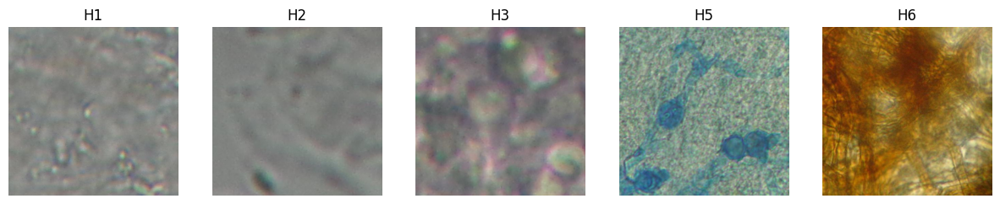

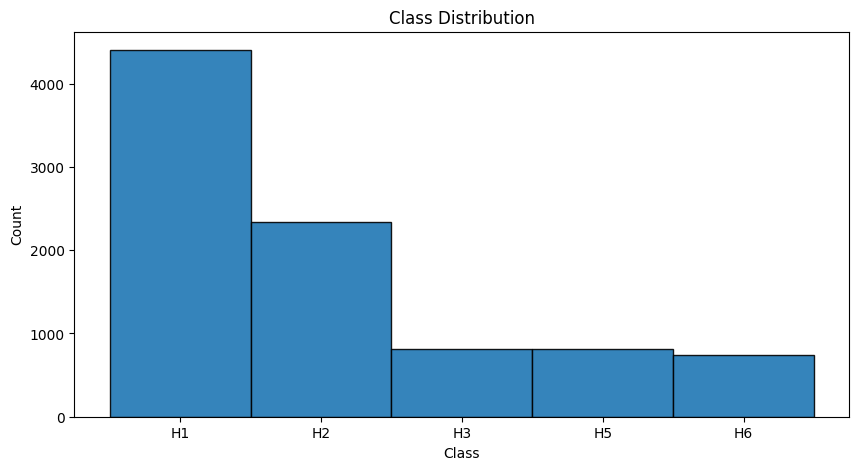

<Figure size 1000x500 with 0 Axes>

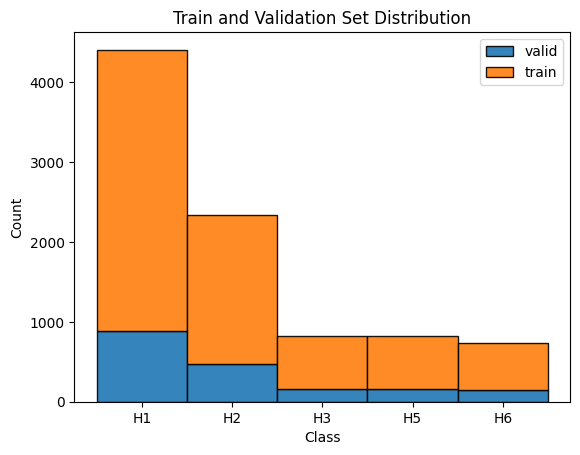

Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 146MB/s] 


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,1.244948,0.810345,0.309929,0.690071,00:34


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.851872,0.569140,0.222161,0.777839,00:45
1,0.640544,0.522268,0.199671,0.800329,00:45
2,0.553397,0.465106,0.180472,0.819528,00:45
3,0.505224,0.423233,0.159627,0.840373,00:45
4,0.452717,0.424379,0.154690,0.845310,00:46
5,0.448307,0.376922,0.139331,0.860669,00:46
6,0.395591,0.410645,0.162918,0.837082,00:46
7,0.374842,0.348974,0.137137,0.862863,00:46
8,0.345719,0.315885,0.120680,0.879320,00:46
9,0.310534,0.369951,0.138234,0.861766,00:46


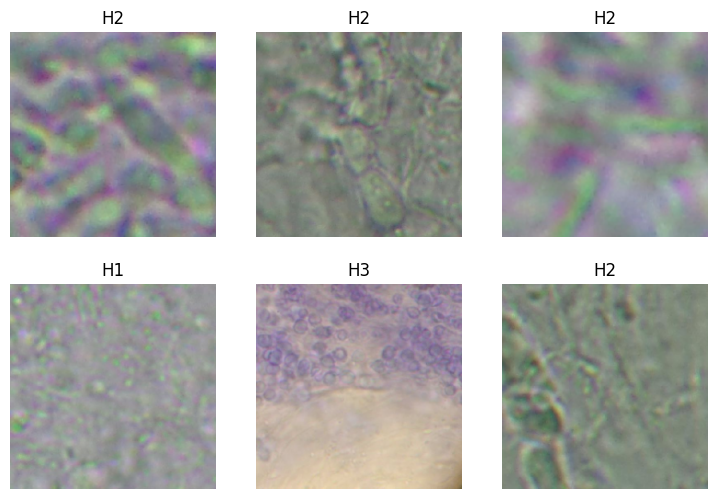

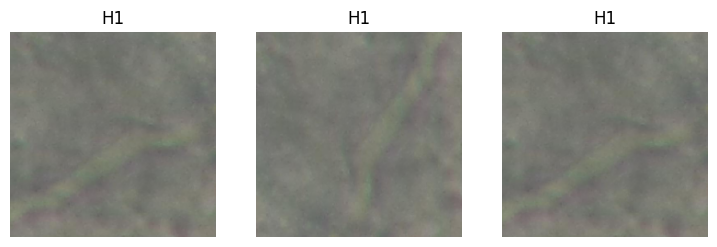

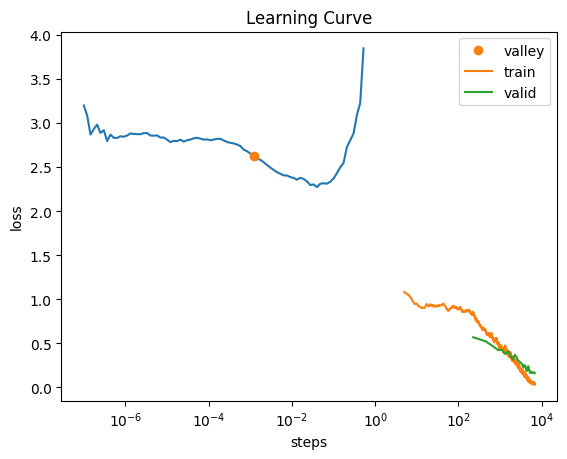

              precision    recall  f1-score   support

          H1       0.92      0.98      0.95       881
          H2       0.96      0.85      0.90       467
          H3       0.97      0.92      0.95       164
          H5       1.00      0.98      0.99       163
          H6       0.99      0.99      0.99       148

    accuracy                           0.94      1823
   macro avg       0.97      0.95      0.96      1823
weighted avg       0.95      0.94      0.94      1823



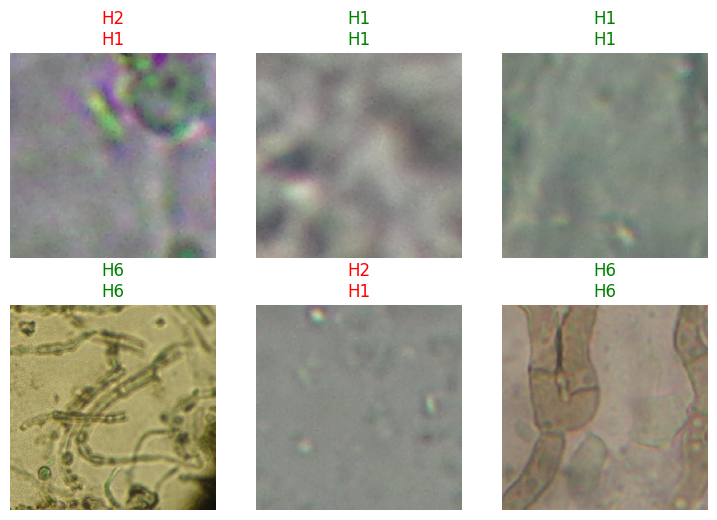

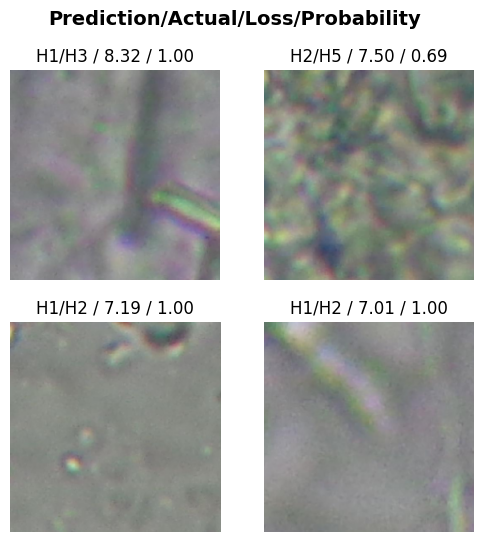

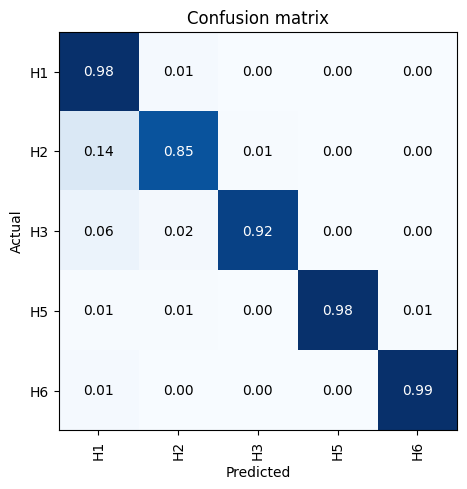

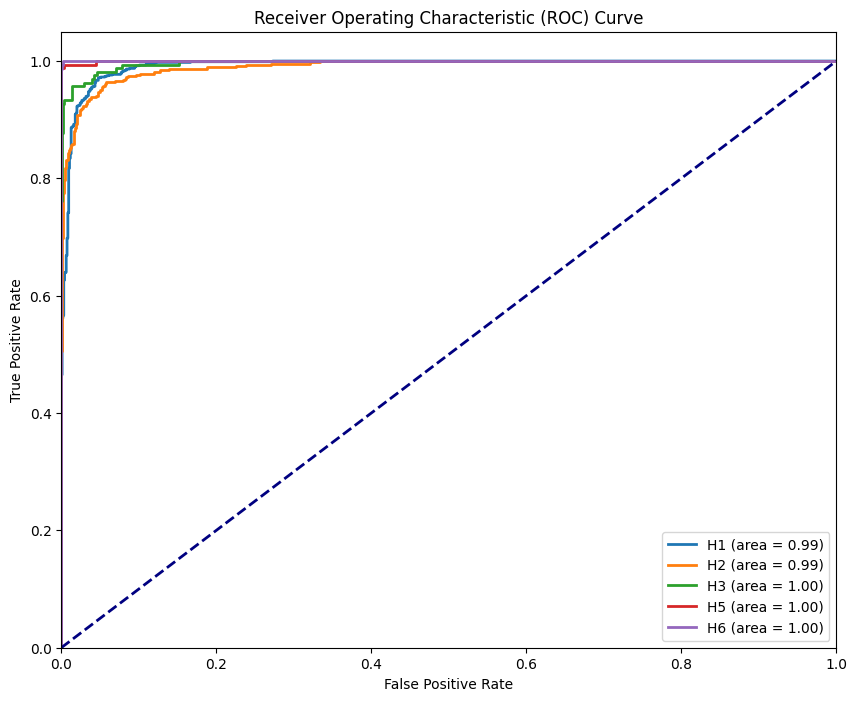

Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.


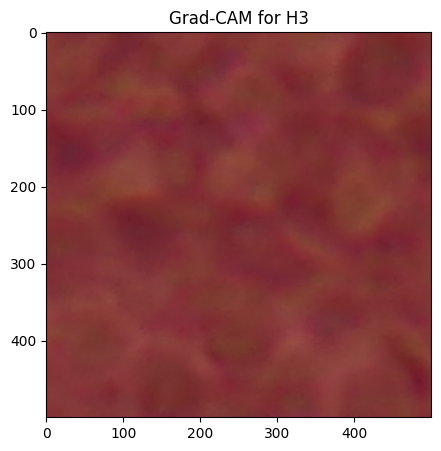

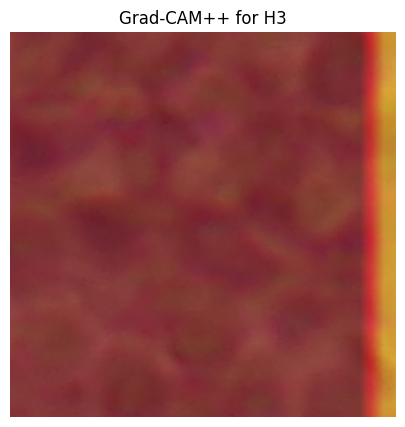

In [ ]:
!pip install captum
from fastai.vision.all import *
from sklearn.metrics import classification_report,roc_curve, auc
import matplotlib.pyplot as plt
from collections import Counter
import torch
import cv2
import numpy as np
import lime
from lime import lime_image
import shap
import torchvision.transforms as transforms
from captum.attr import Saliency, IntegratedGradients, visualization as viz
from skimage.segmentation import mark_boundaries
import torchvision.transforms as T

data_path = Path('/kaggle/input/defungi')
images = get_image_files(data_path)
print(f"No. of images: {len(images)}")

# Print image dimensions
sizes = set(Image.open(img).size for img in images)
print("Image Dimensions:", *sizes)

# Visualize some images
images = []
target = []
counts = []
for path in data_path.ls().sorted():
    target.append(path.name)  # class name is name of parent folder
    class_images = get_image_files(path)
    counts.append(len(class_images))
    img = random.choice(class_images)
    images.append(Image.open(img))

show_images(images, titles=target)

# Bar chart for class distribution
plt.figure(figsize=(10, 5))
plt.bar(target, counts, width=1, edgecolor='black', alpha=0.9)
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Class Distribution')
plt.show()

labels = [parent_label(img) for img in get_image_files(data_path)]
splitter = TrainTestSplitter(test_size=0.2, random_state=42, stratify=labels)

batch_transforms = aug_transforms(size=224, p_affine=0, max_warp=0, flip_vert=True)

dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=splitter,
    get_y=parent_label,
    batch_tfms=batch_transforms
)
dls = dblock.dataloaders(data_path, batch_size=32)

# Check distributions of train and validation set
train_labels = sorted(parent_label(x) for x in dls.train.items)
valid_labels = sorted(parent_label(x) for x in dls.valid.items)
ntrain = list(Counter(train_labels).values())
nvalid = list(Counter(valid_labels).values())

plt.figure(figsize=(10, 5))
ax = plt.subplots()[1]
ax.bar(target, nvalid, width=1, edgecolor='black', alpha=0.9, label='valid')
ax.bar(target, ntrain, width=1, edgecolor='black', alpha=0.9, label='train', bottom=nvalid)
plt.xlabel('Class')
plt.ylabel('Count')
plt.legend()
plt.title('Train and Validation Set Distribution')
plt.show()

# Show batch of images
dls.show_batch(max_n=6, nrows=2)
dls.show_batch(max_n=3, nrows=1, unique=True)

learn = vision_learner(dls, resnet34, metrics=[error_rate, accuracy])
learn.loss_func

# Find learning rate and fine-tune the model
learn.lr_find()
learn.fine_tune(30, 0.002)

# Plot learning curve
learn.recorder.plot_loss()
plt.title('Learning Curve')
plt.show()

# Show results
learn.show_results(max_n=6, nrows=2)

# Plot top losses
interp = Interpretation.from_learner(learn)
interp.plot_top_losses(4)

# Show confusion matrix of predictions on the validation set
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix(normalize=True)

# Generate classification report
preds, y_true = learn.get_preds() # Get predictions and true labels on the validation set
y_pred = preds.argmax(dim=1).numpy() # Convert predictions to numpy array
y_true = y_true.numpy() # Convert true labels to numpy array

# Convert indices to class labels
y_pred_labels = [dls.vocab[idx] for idx in y_pred]
y_true_labels = [dls.vocab[idx] for idx in y_true]

report = classification_report(y_true_labels, y_pred_labels, target_names=dls.vocab)
print(report)

# ROC Curve
fpr = {}
tpr = {}
roc_auc = {}

for i, label in enumerate(dls.vocab):
    fpr[label], tpr[label], _ = roc_curve(y_true == i, preds[:, i])
    roc_auc[label] = auc(fpr[label], tpr[label])

plt.figure(figsize=(10, 8))
for label in dls.vocab:
    plt.plot(fpr[label], tpr[label], lw=2, label=f'{label} (area = {roc_auc[label]:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


def generate_gradcam(learn, img, cls_idx):
    learn.model.eval()
    img = img.unsqueeze(0).to(next(learn.model.parameters()).device)  # Ensure image tensor is on the same device as model

    def hooked_backward(mod, grad_in, grad_out):
        global activations
        activations = grad_out[0]
    
    def hooked_forward(mod, input, output):
        global hook_a
        hook_a = output
    
    # Register hooks on the last convolutional layer
    for module in learn.model[0]:
        if isinstance(module, torch.nn.modules.conv.Conv2d):
            hook = module.register_forward_hook(hooked_forward)
            grad = module.register_backward_hook(hooked_backward)
    
    learn.model.zero_grad()
    out = learn.model(img)
    out[0, cls_idx].backward()

    weights = activations.mean(dim=[1, 2], keepdim=True)
    gradcam = (hook_a * weights).sum(0)
    gradcam = torch.clamp(gradcam, min=0)
    gradcam /= gradcam.max()
    gradcam = gradcam.detach().cpu().numpy()

    grad.remove()
    hook.remove()

    return gradcam

# Test Grad-CAM on validation set images
img, label = dls.valid_ds[0]
img_tensor = tensor(img).float()  # Convert PIL image to PyTorch tensor
img_tensor = img_tensor.permute(2, 0, 1)  # Permute dimensions to match expected input shape
cls_idx = int(label)
gradcam = generate_gradcam(learn, img_tensor.cuda(), cls_idx)

# Resize Grad-CAM heatmap to match image dimensions
heatmap_resized = cv2.resize(gradcam, (img_tensor.shape[1], img_tensor.shape[2]))

# Normalize the heatmap
heatmap_resized = np.uint8(255 * heatmap_resized)

# Ensure heatmap is 2D
if len(heatmap_resized.shape) == 3:
    heatmap_resized = heatmap_resized[:,:,0]

# Apply the color map
heatmap_resized = cv2.applyColorMap(heatmap_resized, cv2.COLORMAP_JET)

# Convert PIL image to numpy array
img = np.array(img)

# Ensure the heatmap and the image have the same number of channels
if img.shape[2] == 4:  # If image is RGBA
    img = cv2.cvtColor(img, cv2.COLOR_RGBA2RGB)

# Deeply highlight the gradient region
overlay = cv2.addWeighted(img, 0.4, heatmap_resized, 0.6, 0)

# Display Grad-CAM
plt.figure(figsize=(10, 5))
plt.imshow(overlay)
plt.title(f'Grad-CAM for {dls.vocab[cls_idx]}')
plt.show()

def generate_gradcam_pp(learn, img, cls_idx):
    learn.model.eval()
    device = next(learn.model.parameters()).device  # Get the device of the model

    # Ensure image tensor is on the same device as model
    img = img.unsqueeze(0).to(device)
    
    activations = None
    gradients = None

    def hooked_backward(module, grad_in, grad_out):
        nonlocal gradients
        gradients = grad_in[0]

    def hooked_forward(module, input, output):
        nonlocal activations
        activations = output

    # Find the last convolutional layer and register hooks
    for module in reversed(list(learn.model.modules())):
        if isinstance(module, torch.nn.Conv2d):
            hook_a = module.register_forward_hook(hooked_forward)
            hook_g = module.register_backward_hook(hooked_backward)
            break

    learn.model.zero_grad()
    out = learn.model(img)
    out[0, cls_idx].backward()

    if gradients is None or activations is None:
        raise ValueError("Gradients or activations were not captured during backward pass.")

    # Calculate alpha weights
    alpha_num = gradients.pow(2)
    alpha_denom = gradients.pow(2) * 2.0 + torch.sum(activations * gradients.pow(3), dim=(2, 3), keepdim=True)
    alpha_denom = torch.where(alpha_denom != 0.0, alpha_denom, torch.ones_like(alpha_denom))
    alpha = alpha_num / alpha_denom

    # Calculate weights using alpha and gradients
    weights = torch.sum(alpha * torch.clamp(gradients, min=0.0), dim=(2, 3))

    # Normalize weights
    weights = torch.nn.functional.relu(weights)  # ReLU on weights
    weights = weights / torch.sum(weights, dim=1, keepdim=True)

    # Compute GradCAM++ heatmap
    gradcam_pp = torch.sum(weights[:, :, None, None] * activations, dim=1)
    gradcam_pp = torch.clamp(gradcam_pp, min=0.0)
    gradcam_pp /= torch.max(gradcam_pp)

    hook_a.remove()
    hook_g.remove()

    return gradcam_pp.detach().cpu().numpy()

# Test Grad-CAM++ on validation set images
img, label = dls.valid_ds[0]
img_tensor = tensor(img).float()  # Convert PIL image to PyTorch tensor
img_tensor = img_tensor.permute(2, 0, 1)  # Permute dimensions to match expected input shape
cls_idx = int(label)
gradcam_pp = generate_gradcam_pp(learn, img_tensor.cuda(), cls_idx)

# Resize Grad-CAM++ heatmap to match image dimensions
heatmap_resized_pp = cv2.resize(gradcam_pp, (img_tensor.shape[1], img_tensor.shape[2]))

# Normalize the heatmap
heatmap_resized_pp = np.uint8(255 * heatmap_resized_pp)

# Ensure heatmap is 2D
if len(heatmap_resized_pp.shape) == 3:
    heatmap_resized_pp = heatmap_resized_pp[:,:,0]

# Apply the color map
heatmap_resized_pp = cv2.applyColorMap(heatmap_resized_pp, cv2.COLORMAP_JET)

# Convert PIL image to numpy array
img = np.array(img)

# Ensure the heatmap and the image have the same number of channels
if img.shape[2] == 4:  # If image is RGBA
    img = cv2.cvtColor(img, cv2.COLOR_RGBA2RGB)

# Deeply highlight the gradient region
overlay_pp = cv2.addWeighted(img, 0.4, heatmap_resized_pp, 0.6, 0)

# Display Grad-CAM++
plt.figure(figsize=(10, 5))
plt.imshow(overlay_pp)
plt.title(f'Grad-CAM++ for {dls.vocab[cls_idx]}')
plt.axis('off')
plt.show()

def lime_explanation(img):
    def predict(images):
        images = torch.stack([vision_transform(im) for im in images])
        preds = learn.model(images.cuda())
        return preds.softmax(dim=1).cpu().detach().numpy()
    
    explainer = lime_image.LimeImageExplainer()
    explanation = explainer.explain_instance(np.array(img), predict, top_labels=1, hide_color=0, num_samples=1000)

    temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=30, hide_rest=False)
    plt.imshow(mark_boundaries(temp, mask))
    plt.title('LIME Explanation')
    plt.show()

# Vision transform to convert PIL image to tensor
def vision_transform(img):
    transform = T.ToTensor()
    return transform(img)

# Test LIME explanation
lime_explanation(img)

def integrated_gradients_explanation(learn, img_tensor):
    img_tensor = img_tensor.unsqueeze(0).cuda()  # Ensure tensor is on GPU
    ig = IntegratedGradients(learn.model)
    
    # Baseline is a black image (all zeros)
    baselines = img_tensor * 0
    
    # Compute attributions
    attributions = ig.attribute(img_tensor, target=cls_idx, baselines=baselines)
    
    # Convert attributions to numpy array
    attr_np = attributions.squeeze().detach().cpu().numpy().transpose(1, 2, 0)

    # Normalize attributions for visualization
    attr_np = (attr_np - attr_np.min()) / (attr_np.max() - attr_np.min())

    # Display attributions
    plt.imshow(attr_np, cmap='viridis')
    plt.title('Integrated Gradients Explanation')
    plt.colorbar()
    plt.show()

# Example call to the function with 'learn' as the model and 'img_tensor' as the input image tensor
img, label = dls.valid_ds[0]
img_tensor = tensor(img).float()  # Convert PIL image to PyTorch tensor
img_tensor = img_tensor.permute(2, 0, 1)  # Permute dimensions to match expected input shape
integrated_gradients_explanation(learn, img_tensor)

def saliency_map_explanation(learn, img_tensor):
    img_tensor = img_tensor.unsqueeze(0).cuda()  # Ensure tensor is on GPU
    saliency = Saliency(learn.model)
    
    # Compute attributions
    attributions = saliency.attribute(img_tensor, target=cls_idx)
    
    # Convert attributions to numpy array
    attr_np = attributions.squeeze().detach().cpu().numpy().transpose(1, 2, 0)

    # Normalize attributions for visualization
    attr_np = (attr_np - attr_np.min()) / (attr_np.max() - attr_np.min())

    # Display attributions
    plt.imshow(attr_np, cmap='viridis')
    plt.title('Saliency Map Explanation')
    plt.colorbar()
    plt.show()

# Example call to the function with 'learn' as the model and 'img_tensor' as the input image tensor
img, label = dls.valid_ds[0]
img_tensor = tensor(img).float()  # Convert PIL image to PyTorch tensor
img_tensor = img_tensor.permute(2, 0, 1)  # Permute dimensions to match expected input shape
saliency_map_explanation(learn, img_tensor)

# DeepDream implementation
def deepdream(img_tensor, model, iterations, lr):
    model.eval()
    img_tensor = img_tensor.unsqueeze(0).to(next(model.parameters()).device)  # Ensure tensor is on the same device as model
    img_tensor.requires_grad = True

    for i in range(iterations):
        model.zero_grad()
        out = model(img_tensor)
        loss = out.norm()
        loss.backward()
        img_tensor.data += lr * img_tensor.grad.data
        img_tensor.grad.data.zero_()

    # Deeply highlight the regions
    deepdream_img = img_tensor.squeeze().detach().cpu().numpy().transpose(1, 2, 0)
    deepdream_img = (deepdream_img - deepdream_img.min()) / (deepdream_img.max() - deepdream_img.min())
    
    return deepdream_img

# Test DeepDream on validation set image
deepdream_img = deepdream(img_tensor, learn.model, iterations=10, lr=0.01)

# Display DeepDream result
plt.figure(figsize=(10, 5))
plt.imshow(deepdream_img)
plt.title('DeepDream')
plt.show()


# Apply interpretability techniques on an image from each category
for category in target:
    print(f"Category: {category}")
    class_images = get_image_files(data_path/category)
    img_path = random.choice(class_images)
    img = Image.open(img_path)
    img_tensor = tensor(img).float()  # Convert PIL image to PyTorch tensor
    img_tensor = img_tensor.permute(2, 0, 1)  # Permute dimensions to match expected input shape

    # Grad-CAM
    cls_idx = dls.vocab.o2i[category]  # Correct way to get the index of the category
    gradcam = generate_gradcam(learn, img_tensor.cuda(), cls_idx)
    heatmap_resized = cv2.resize(gradcam, (img_tensor.shape[1], img_tensor.shape[2]))
    heatmap_resized = np.uint8(255 * heatmap_resized)
    if len(heatmap_resized.shape) == 3:
        heatmap_resized = heatmap_resized[:,:,0]
    heatmap_resized = cv2.applyColorMap(heatmap_resized, cv2.COLORMAP_JET)
    img_np = np.array(img)
    if img_np.shape[2] == 4:
        img_np = cv2.cvtColor(img_np, cv2.COLOR_RGBA2RGB)
    overlay = cv2.addWeighted(img_np, 0.4, heatmap_resized, 0.6, 0)
    plt.figure(figsize=(10, 5))
    plt.imshow(overlay)
    plt.title(f'Grad-CAM for {category}')
    plt.show()

    # LIME
    lime_explanation(img)

    # Integrated Gradients
    integrated_gradients_explanation(learn, img_tensor)

    # Saliency Map
    saliency_map_explanation(learn, img_tensor)
    
    # DeepDream
    deepdream_img = deepdream(img_tensor, learn.model, iterations=10, lr=0.01)
    plt.figure(figsize=(10, 5))
    plt.imshow(deepdream_img)
    plt.title(f'DeepDream for {category}')
    plt.show()



# **Final Model Building and Testing **

In [ ]:
!pip install captum
from fastai.vision.all import *
from sklearn.metrics import classification_report, roc_curve, auc
import matplotlib.pyplot as plt
from collections import Counter
import torch
import cv2
import numpy as np
import lime
from lime import lime_image
import shap
import torchvision.transforms as transforms
from captum.attr import Saliency, IntegratedGradients, visualization as viz
from skimage.segmentation import mark_boundaries
import torchvision.transforms as T

data_path = Path('/kaggle/input/defungi')
images = get_image_files(data_path)
print(f"No. of images: {len(images)}")

# Print image dimensions
sizes = set(Image.open(img).size for img in images)
print("Image Dimensions:", *sizes)

# Visualize some images
images = []
target = []
counts = []
for path in data_path.ls().sorted():
    target.append(path.name)  # class name is name of parent folder
    class_images = get_image_files(path)
    counts.append(len(class_images))
    img = random.choice(class_images)
    images.append(Image.open(img))

show_images(images, titles=target)
print("\n\n")

# Bar chart for class distribution
plt.figure(figsize=(10, 5))
plt.bar(target, counts, width=1, edgecolor='black', alpha=0.9)
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Class Distribution')
plt.show()

print("\n\n")

labels = [parent_label(img) for img in get_image_files(data_path)]
splitter = TrainTestSplitter(test_size=0.2, random_state=42, stratify=labels)

batch_transforms = aug_transforms(size=224, p_affine=0, max_warp=0, flip_vert=True)

dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=splitter,
    get_y=parent_label,
    batch_tfms=batch_transforms
)
dls = dblock.dataloaders(data_path, batch_size=32)

# Check distributions of train and validation set
train_labels = sorted(parent_label(x) for x in dls.train.items)
valid_labels = sorted(parent_label(x) for x in dls.valid.items)
ntrain = list(Counter(train_labels).values())
nvalid = list(Counter(valid_labels).values())

plt.figure(figsize=(10, 5))
ax = plt.subplots()[1]
ax.bar(target, nvalid, width=1, edgecolor='black', alpha=0.9, label='valid')
ax.bar(target, ntrain, width=1, edgecolor='black', alpha=0.9, label='train', bottom=nvalid)
plt.xlabel('Class')
plt.ylabel('Count')
plt.legend()
plt.title('Train and Validation Set Distribution')
plt.show()

print("\n\n")

# Show batch of images
dls.show_batch(max_n=6, nrows=2)
dls.show_batch(max_n=3, nrows=1, unique=True)

print("\n\n")

learn = vision_learner(dls, resnet34, metrics=[error_rate, accuracy])
learn.loss_func

# Find learning rate and fine-tune the model
learn.lr_find()
print("\n\n")
learn.fine_tune(30, 0.002)

# Plot learning curve
learn.recorder.plot_loss()
# plt.title('Learning Curve')
# plt.show()
print("\n\n")

# Show results
learn.show_results(max_n=6, nrows=2)

# Plot top losses
interp = Interpretation.from_learner(learn)
interp.plot_top_losses(4)

print("\n\n")

# Show confusion matrix of predictions on the validation set
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix(normalize=True)

print("\n\n")

# Generate classification report
preds, y_true = learn.get_preds() # Get predictions and true labels on the validation set
y_pred = preds.argmax(dim=1).numpy() # Convert predictions to numpy array
y_true = y_true.numpy() # Convert true labels to numpy array

# Convert indices to class labels
y_pred_labels = [dls.vocab[idx] for idx in y_pred]
y_true_labels = [dls.vocab[idx] for idx in y_true]

report = classification_report(y_true_labels, y_pred_labels, target_names=dls.vocab)
print(report)

# ROC Curve
fpr = {}
tpr = {}
roc_auc = {}

for i, label in enumerate(dls.vocab):
    fpr[label], tpr[label], _ = roc_curve(y_true == i, preds[:, i])
    roc_auc[label] = auc(fpr[label], tpr[label])

# Plot ROC Curve
plt.figure(figsize=(10, 8))
for label in dls.vocab:
    plt.plot(fpr[label], tpr[label], lw=2, label=f'{label} (area = {roc_auc[label]:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

def generate_gradcam(learn, img, cls_idx):
    learn.model.eval()
    img = img.unsqueeze(0).to(next(learn.model.parameters()).device)  # Ensure image tensor is on the same device as model

    def hooked_backward(mod, grad_in, grad_out):
        global activations
        activations = grad_out[0]
    
    def hooked_forward(mod, input, output):
        global hook_a
        hook_a = output
    
    # Register hooks on the last convolutional layer
    for module in learn.model[0]:
        if isinstance(module, torch.nn.modules.conv.Conv2d):
            hook = module.register_forward_hook(hooked_forward)
            grad = module.register_backward_hook(hooked_backward)
    
    learn.model.zero_grad()
    out = learn.model(img)
    out[0, cls_idx].backward()

    weights = activations.mean(dim=[1, 2], keepdim=True)
    gradcam = (hook_a * weights).sum(0)
    gradcam = torch.clamp(gradcam, min=0)
    gradcam /= gradcam.max()
    gradcam = gradcam.detach().cpu().numpy()

    grad.remove()
    hook.remove()

    return gradcam

# Test Grad-CAM on validation set images
img, label = dls.valid_ds[0]
img_tensor = tensor(img).float()  # Convert PIL image to PyTorch tensor
img_tensor = img_tensor.permute(2, 0, 1)  # Permute dimensions to match expected input shape
cls_idx = int(label)
gradcam = generate_gradcam(learn, img_tensor.cuda(), cls_idx)

# Resize Grad-CAM heatmap to match image dimensions
heatmap_resized = cv2.resize(gradcam, (img_tensor.shape[1], img_tensor.shape[2]))

# Normalize the heatmap
heatmap_resized = np.uint8(255 * heatmap_resized)

# Ensure heatmap is 2D
if len(heatmap_resized.shape) == 3:
    heatmap_resized = heatmap_resized[:,:,0]

# Apply the color map
heatmap_resized = cv2.applyColorMap(heatmap_resized, cv2.COLORMAP_JET)

# Convert PIL image to numpy array
img = np.array(img)

# Ensure the heatmap and the image have the same number of channels
if img.shape[2] == 4:  # If image is RGBA
    img = cv2.cvtColor(img, cv2.COLOR_RGBA2RGB)

# Deeply highlight the gradient region
overlay = cv2.addWeighted(img, 0.4, heatmap_resized, 0.6, 0)

# Display Grad-CAM
plt.figure(figsize=(10, 5))
plt.imshow(overlay)
plt.title(f'Grad-CAM for {dls.vocab[cls_idx]}')
plt.show()

def generate_gradcam_pp(learn, img, cls_idx):
    learn.model.eval()
    device = next(learn.model.parameters()).device  # Get the device of the model

    # Ensure image tensor is on the same device as model
    img = img.unsqueeze(0).to(device)
    
    activations = None
    gradients = None

    def hooked_backward(module, grad_in, grad_out):
        nonlocal gradients
        gradients = grad_in[0]

    def hooked_forward(module, input, output):
        nonlocal activations
        activations = output

    # Find the last convolutional layer and register hooks
    for module in reversed(list(learn.model.modules())):
        if isinstance(module, torch.nn.Conv2d):
            hook_a = module.register_forward_hook(hooked_forward)
            hook_g = module.register_backward_hook(hooked_backward)
            break

    learn.model.zero_grad()
    out = learn.model(img)
    out[0, cls_idx].backward()

    if gradients is None or activations is None:
        raise ValueError("Gradients or activations were not captured during backward pass.")

    # Calculate alpha weights
    alpha_num = gradients.pow(2)
    alpha_denom = gradients.pow(2) * 2.0 + torch.sum(activations * gradients.pow(3), dim=(2, 3), keepdim=True)
    alpha_denom = torch.where(alpha_denom != 0.0, alpha_denom, torch.ones_like(alpha_denom))
    alpha = alpha_num / alpha_denom

    # Calculate weights using alpha and gradients
    weights = torch.sum(alpha * torch.clamp(gradients, min=0.0), dim=(2, 3))

    # Normalize weights
    weights = torch.nn.functional.relu(weights)  # ReLU on weights
    weights = weights / torch.sum(weights, dim=1, keepdim=True)

    # Compute GradCAM++ heatmap
    gradcam_pp = torch.sum(weights[:, :, None, None] * activations, dim=1)
    gradcam_pp = torch.clamp(gradcam_pp, min=0.0)
    gradcam_pp /= torch.max(gradcam_pp)

    hook_a.remove()
    hook_g.remove()

    return gradcam_pp.detach().cpu().numpy()

# Test Grad-CAM++ on validation set images
img, label = dls.valid_ds[0]
img_tensor = tensor(img).float()  # Convert PIL image to PyTorch tensor
img_tensor = img_tensor.permute(2, 0, 1)  # Permute dimensions to match expected input shape
cls_idx = int(label)
gradcam_pp = generate_gradcam_pp(learn, img_tensor.cuda(), cls_idx)

# Resize Grad-CAM++ heatmap to match image dimensions
heatmap_resized_pp = cv2.resize(gradcam_pp, (img_tensor.shape[1], img_tensor.shape[2]))

# Normalize the heatmap
heatmap_resized_pp = np.uint8(255 * heatmap_resized_pp)

# Ensure heatmap is 2D
if len(heatmap_resized_pp.shape) == 3:
    heatmap_resized_pp = heatmap_resized_pp[:,:,0]

# Apply the color map
heatmap_resized_pp = cv2.applyColorMap(heatmap_resized_pp, cv2.COLORMAP_JET)

# Convert PIL image to numpy array
img = np.array(img)

# Ensure the heatmap and the image have the same number of channels
if img.shape[2] == 4:  # If image is RGBA
    img = cv2.cvtColor(img, cv2.COLOR_RGBA2RGB)

# Deeply highlight the gradient region
overlay_pp = cv2.addWeighted(img, 0.4, heatmap_resized_pp, 0.6, 0)

# Display Grad-CAM++
plt.figure(figsize=(10, 5))
plt.imshow(overlay_pp)
plt.title(f'Grad-CAM++ for {dls.vocab[cls_idx]}')
plt.axis('off')
plt.show()

def lime_explanation(img):
    def predict(images):
        images = torch.stack([vision_transform(im) for im in images])
        preds = learn.model(images.cuda())
        return preds.softmax(dim=1).cpu().detach().numpy()
    
    explainer = lime_image.LimeImageExplainer()
    explanation = explainer.explain_instance(np.array(img), predict, top_labels=1, hide_color=0, num_samples=1000)

    temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=30, hide_rest=False)
    plt.imshow(mark_boundaries(temp, mask))
    plt.title('LIME Explanation')
    plt.show()

# Vision transform to convert PIL image to tensor
def vision_transform(img):
    transform = T.ToTensor()
    return transform(img)

# Test LIME explanation
lime_explanation(img)

def integrated_gradients_explanation(learn, img_tensor):
    img_tensor = img_tensor.unsqueeze(0).cuda()  # Ensure tensor is on GPU
    ig = IntegratedGradients(learn.model)
    
    # Baseline is a black image (all zeros)
    baselines = img_tensor * 0
    
    # Compute attributions
    attributions = ig.attribute(img_tensor, target=cls_idx, baselines=baselines)
    
    # Convert attributions to numpy array
    attr_np = attributions.squeeze().detach().cpu().numpy().transpose(1, 2, 0)

    # Normalize attributions for visualization
    attr_np = (attr_np - attr_np.min()) / (attr_np.max() - attr_np.min())

    # Display attributions
    plt.imshow(attr_np, cmap='viridis')
    plt.title('Integrated Gradients Explanation')
    plt.colorbar()
    plt.show()

# Example call to the function with 'learn' as the model and 'img_tensor' as the input image tensor
img, label = dls.valid_ds[0]
img_tensor = tensor(img).float()  # Convert PIL image to PyTorch tensor
img_tensor = img_tensor.permute(2, 0, 1)  # Permute dimensions to match expected input shape
integrated_gradients_explanation(learn, img_tensor)

def saliency_map_explanation(learn, img_tensor):
    img_tensor = img_tensor.unsqueeze(0).cuda()  # Ensure tensor is on GPU
    saliency = Saliency(learn.model)
    
    # Compute attributions
    attributions = saliency.attribute(img_tensor, target=cls_idx)
    
    # Convert attributions to numpy array
    attr_np = attributions.squeeze().detach().cpu().numpy().transpose(1, 2, 0)

    # Normalize attributions for visualization
    attr_np = (attr_np - attr_np.min()) / (attr_np.max() - attr_np.min())

    # Display attributions
    plt.imshow(attr_np, cmap='viridis')
    plt.title('Saliency Map Explanation')
    plt.colorbar()
    plt.show()

# Example call to the function with 'learn' as the model and 'img_tensor' as the input image tensor
img, label = dls.valid_ds[0]
img_tensor = tensor(img).float()  # Convert PIL image to PyTorch tensor
img_tensor = img_tensor.permute(2, 0, 1)  # Permute dimensions to match expected input shape
saliency_map_explanation(learn, img_tensor)



No. of images: 2940
Image Dimensions: (772, 894) (176, 231) (195, 244) (668, 693) (322, 285) (907, 938) (180, 201) (198, 249) (304, 416) (1075, 1425) (2324, 1112) (323, 249) (228, 277) (232, 247) (318, 436) (173, 197) (413, 444) (410, 518) (362, 478) (302, 347) (767, 792) (206, 230) (500, 448) (378, 422) (398, 400) (216, 280) (422, 385) (382, 312) (188, 218) (220, 250) (180, 214) (345, 510) (339, 350) (245, 343) (197, 266) (190, 227) (302, 468) (241, 309) (614, 591) (405, 417) (183, 224) (282, 346) (202, 237) (646, 888) (254, 284) (385, 438) (373, 384) (497, 536) (307, 375) (227, 266) (406, 646) (319, 349) (280, 278) (453, 349) (186, 234) (285, 356) (191, 200) (317, 425) (256, 329) (169, 181) (201, 250) (160, 212) (120, 176) (900, 1154) (328, 354) (161, 177) (172, 186) (352, 382) (205, 220) (384, 371) (902, 971) (200, 290) (364, 392) (576, 806) (454, 551) (287, 294) (232, 358) (359, 399) (210, 190) (297, 344) (180, 204) (260, 276) (285, 369) (190, 217) (315, 248) (260, 312) (180, 289) 

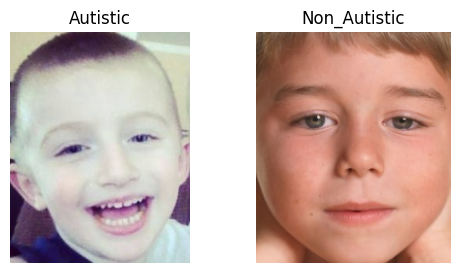

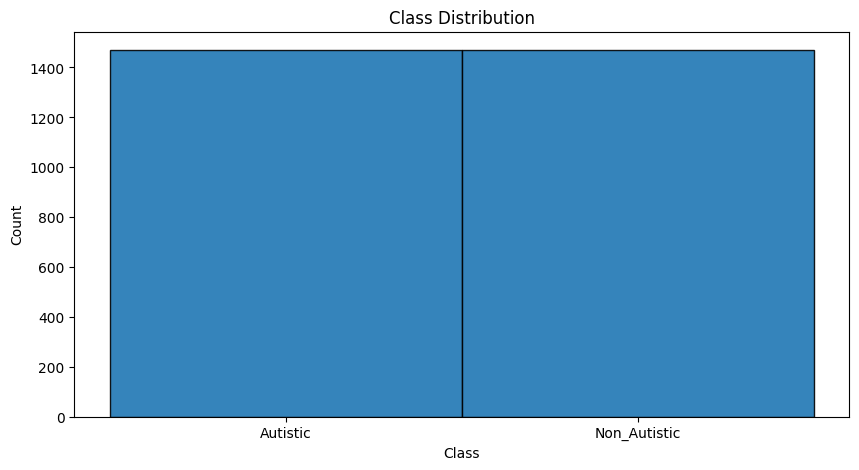

<Figure size 1000x500 with 0 Axes>

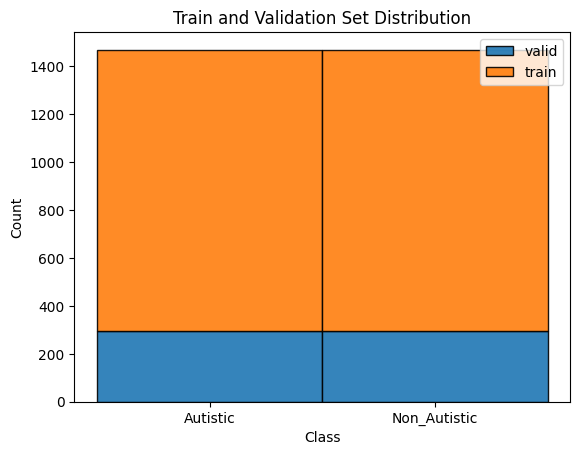

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.967387,0.615209,0.256803,0.743197,00:11


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.590030,0.436916,0.212585,0.787415,00:15
1,0.458885,0.406714,0.193878,0.806122,00:15
2,0.398669,0.422232,0.202381,0.797619,00:15
3,0.393466,0.425956,0.173469,0.826531,00:15
4,0.377878,0.380110,0.154762,0.845238,00:15
5,0.418300,0.418061,0.200680,0.799320,00:15
6,0.398562,0.511638,0.197279,0.802721,00:15
7,0.403589,2.180103,0.328231,0.671769,00:15
8,0.374956,0.757717,0.226190,0.773810,00:15
9,0.356187,0.669560,0.226190,0.773810,00:15


              precision    recall  f1-score   support

    Autistic       0.88      0.85      0.87       294
Non_Autistic       0.86      0.89      0.87       294

    accuracy                           0.87       588
   macro avg       0.87      0.87      0.87       588
weighted avg       0.87      0.87      0.87       588



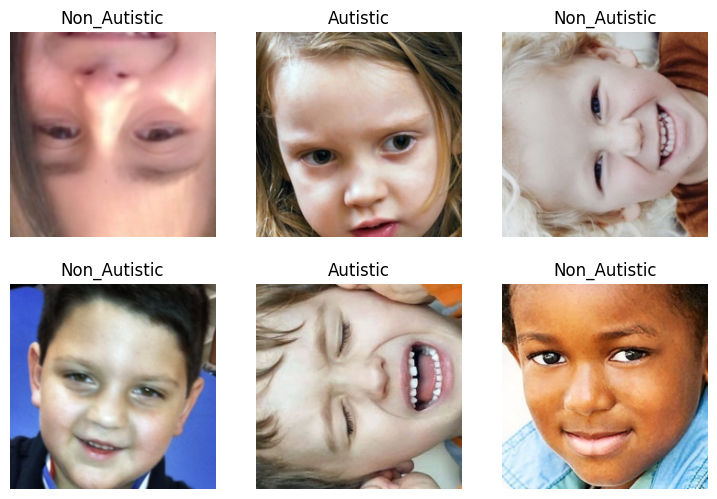

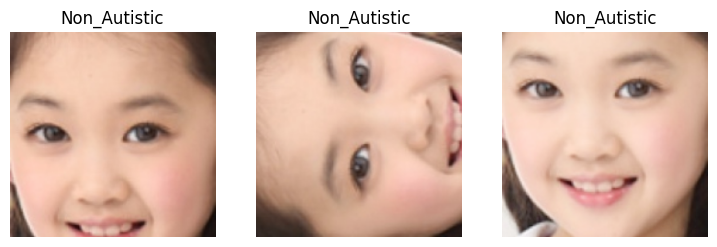

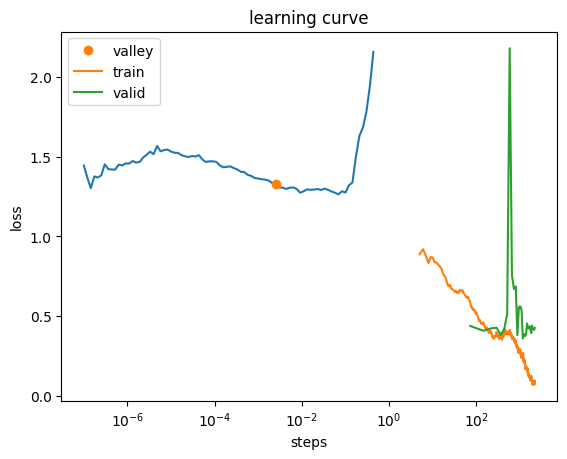

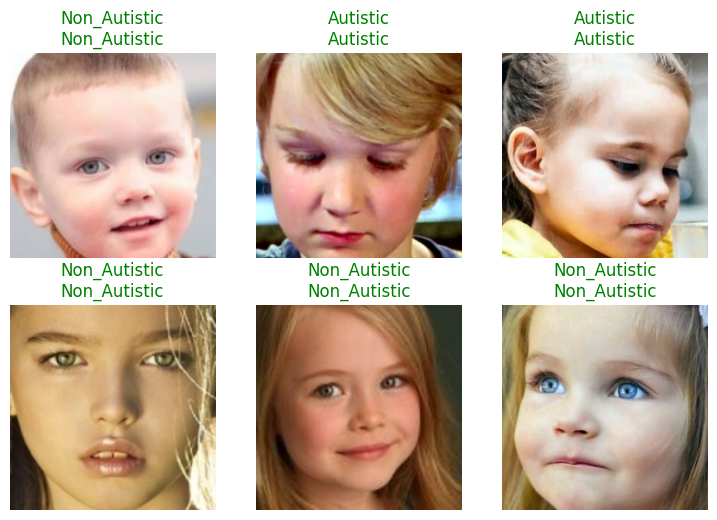

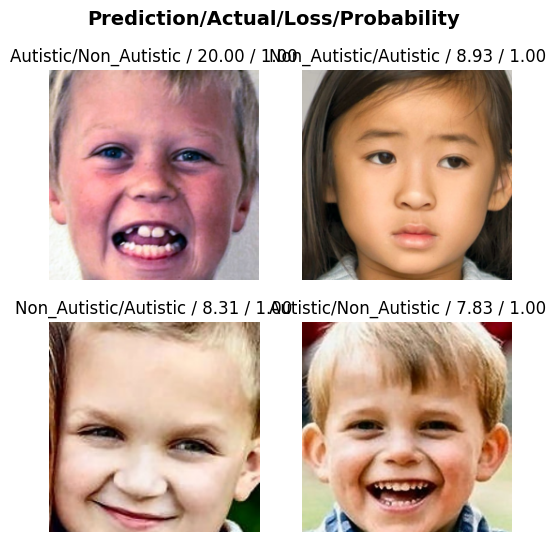

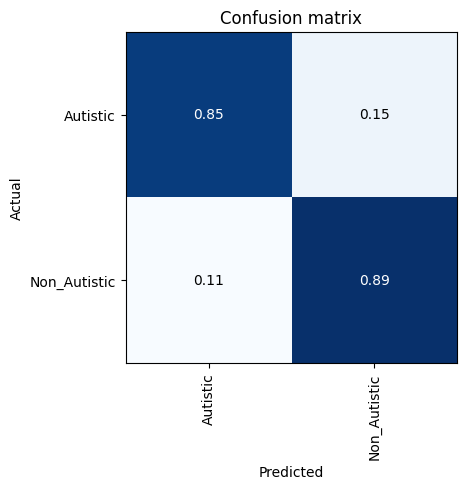

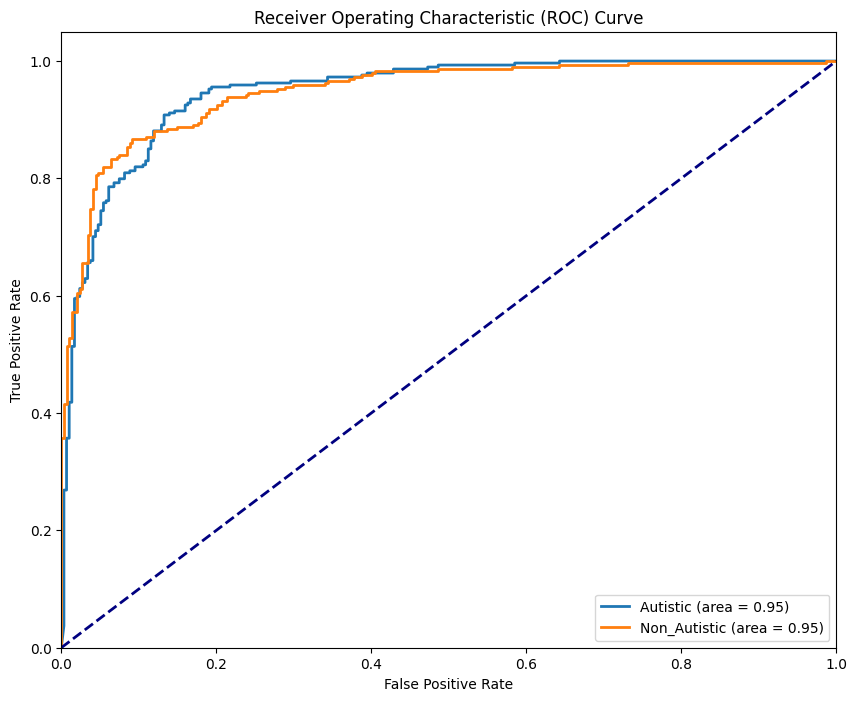

Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.


error: OpenCV(4.10.0) /io/opencv/modules/core/src/arithm.cpp:658: error: (-209:Sizes of input arguments do not match) The operation is neither 'array op array' (where arrays have the same size and the same number of channels), nor 'array op scalar', nor 'scalar op array' in function 'arithm_op'


In [4]:
!pip install captum
from fastai.vision.all import *
from sklearn.metrics import classification_report, roc_curve, auc
import matplotlib.pyplot as plt
from collections import Counter
import torch
import cv2
import numpy as np
import lime
from lime import lime_image
import shap
import torchvision.transforms as transforms
from captum.attr import Saliency, IntegratedGradients, visualization as viz
from skimage.segmentation import mark_boundaries
import torchvision.transforms as T

data_path = Path('/kaggle/input/autism-dataset/dataset/consolidated')
images = get_image_files(data_path)
print(f"No. of images: {len(images)}")

# Print image dimensions
sizes = set(Image.open(img).size for img in images)
print("Image Dimensions:", *sizes)

# Visualize some images
images = []
target = []
counts = []
for path in data_path.ls().sorted():
    target.append(path.name)  # class name is name of parent folder
    class_images = get_image_files(path)
    counts.append(len(class_images))
    img = random.choice(class_images)
    images.append(Image.open(img))

show_images(images, titles=target)
print("\n\n")

# Bar chart for class distribution
plt.figure(figsize=(10, 5))
plt.bar(target, counts, width=1, edgecolor='black', alpha=0.9)
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Class Distribution')
plt.show()

print("\n\n")

labels = [parent_label(img) for img in get_image_files(data_path)]
splitter = TrainTestSplitter(test_size=0.2, random_state=42, stratify=labels)

batch_transforms = aug_transforms(size=224, p_affine=0, max_warp=0, flip_vert=True)

dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=splitter,
    get_y=parent_label,
    item_tfms=Resize(224),
    batch_tfms=batch_transforms
)
dls = dblock.dataloaders(data_path, batch_size=32)

# Check distributions of train and validation set
train_labels = sorted(parent_label(x) for x in dls.train.items)
valid_labels = sorted(parent_label(x) for x in dls.valid.items)
ntrain = list(Counter(train_labels).values())
nvalid = list(Counter(valid_labels).values())

plt.figure(figsize=(10, 5))
ax = plt.subplots()[1]
ax.bar(target, nvalid, width=1, edgecolor='black', alpha=0.9, label='valid')
ax.bar(target, ntrain, width=1, edgecolor='black', alpha=0.9, label='train', bottom=nvalid)
plt.xlabel('Class')
plt.ylabel('Count')
plt.legend()
plt.title('Train and Validation Set Distribution')
plt.show()

print("\n\n")

# Show batch of images
dls.show_batch(max_n=6, nrows=2)
dls.show_batch(max_n=3, nrows=1, unique=True)

print("\n\n")

learn = vision_learner(dls, resnet34, metrics=[error_rate, accuracy])
learn.loss_func

# Find learning rate and fine-tune the model
learn.lr_find()
print("\n\n")
learn.fine_tune(30, 0.01)

# Plot learning curve
learn.recorder.plot_loss()
# plt.title('Learning Curve')
# plt.show()
print("\n\n")

# Show results
learn.show_results(max_n=6, nrows=2)

# Plot top losses
interp = Interpretation.from_learner(learn)
interp.plot_top_losses(4)

print("\n\n")

# Show confusion matrix of predictions on the validation set
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix(normalize=True)

print("\n\n")

# Generate classification report
preds, y_true = learn.get_preds() # Get predictions and true labels on the validation set
y_pred = preds.argmax(dim=1).numpy() # Convert predictions to numpy array
y_true = y_true.numpy() # Convert true labels to numpy array

# Convert indices to class labels
y_pred_labels = [dls.vocab[idx] for idx in y_pred]
y_true_labels = [dls.vocab[idx] for idx in y_true]

report = classification_report(y_true_labels, y_pred_labels, target_names=dls.vocab)
print(report)

# ROC Curve
fpr = {}
tpr = {}
roc_auc = {}

for i, label in enumerate(dls.vocab):
    fpr[label], tpr[label], _ = roc_curve(y_true == i, preds[:, i])
    roc_auc[label] = auc(fpr[label], tpr[label])

# Plot ROC Curve
plt.figure(figsize=(10, 8))
for label in dls.vocab:
    plt.plot(fpr[label], tpr[label], lw=2, label=f'{label} (area = {roc_auc[label]:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

def generate_gradcam(learn, img, cls_idx):
    learn.model.eval()
    img = img.unsqueeze(0).to(next(learn.model.parameters()).device)  # Ensure image tensor is on the same device as model

    def hooked_backward(mod, grad_in, grad_out):
        global activations
        activations = grad_out[0]
    
    def hooked_forward(mod, input, output):
        global hook_a
        hook_a = output
    
    # Register hooks on the last convolutional layer
    for module in learn.model[0]:
        if isinstance(module, torch.nn.modules.conv.Conv2d):
            hook = module.register_forward_hook(hooked_forward)
            grad = module.register_backward_hook(hooked_backward)
    
    learn.model.zero_grad()
    out = learn.model(img)
    out[0, cls_idx].backward()

    weights = activations.mean(dim=[1, 2], keepdim=True)
    gradcam = (hook_a * weights).sum(0)
    gradcam = torch.clamp(gradcam, min=0)
    gradcam /= gradcam.max()
    gradcam = gradcam.detach().cpu().numpy()

    grad.remove()
    hook.remove()

    return gradcam

# Test Grad-CAM on validation set images
img, label = dls.valid_ds[0]
img_tensor = tensor(img).float()  # Convert PIL image to PyTorch tensor
img_tensor = img_tensor.permute(2, 0, 1)  # Permute dimensions to match expected input shape
cls_idx = int(label)
gradcam = generate_gradcam(learn, img_tensor.cuda(), cls_idx)

# Resize Grad-CAM heatmap to match image dimensions
heatmap_resized = cv2.resize(gradcam, (img_tensor.shape[1], img_tensor.shape[2]))

# Normalize the heatmap
heatmap_resized = np.uint8(255 * heatmap_resized)

# Ensure heatmap is 2D
if len(heatmap_resized.shape) == 3:
    heatmap_resized = heatmap_resized[:,:,0]

# Apply the color map
heatmap_resized = cv2.applyColorMap(heatmap_resized, cv2.COLORMAP_JET)

# Convert PIL image to numpy array
img = np.array(img)

# Ensure the heatmap and the image have the same number of channels
if img.shape[2] == 4:  # If image is RGBA
    img = cv2.cvtColor(img, cv2.COLOR_RGBA2RGB)

# Deeply highlight the gradient region
overlay = cv2.addWeighted(img, 0.4, heatmap_resized, 0.6, 0)

# Display Grad-CAM
plt.figure(figsize=(10, 5))
plt.imshow(overlay)
plt.title(f'Grad-CAM for {dls.vocab[cls_idx]}')
plt.show()

def generate_gradcam_pp(learn, img, cls_idx):
    learn.model.eval()
    device = next(learn.model.parameters()).device  # Get the device of the model

    # Ensure image tensor is on the same device as model
    img = img.unsqueeze(0).to(device)
    
    activations = None
    gradients = None

    def hooked_backward(module, grad_in, grad_out):
        nonlocal gradients
        gradients = grad_in[0]

    def hooked_forward(module, input, output):
        nonlocal activations
        activations = output

    # Find the last convolutional layer and register hooks
    for module in reversed(list(learn.model.modules())):
        if isinstance(module, torch.nn.Conv2d):
            hook_a = module.register_forward_hook(hooked_forward)
            hook_g = module.register_backward_hook(hooked_backward)
            break

    learn.model.zero_grad()
    out = learn.model(img)
    out[0, cls_idx].backward()

    if gradients is None or activations is None:
        raise ValueError("Gradients or activations were not captured during backward pass.")

    # Calculate alpha weights
    alpha_num = gradients.pow(2)
    alpha_denom = gradients.pow(2) * 2.0 + torch.sum(activations * gradients.pow(3), dim=(2, 3), keepdim=True)
    alpha_denom = torch.where(alpha_denom != 0.0, alpha_denom, torch.ones_like(alpha_denom))
    alpha = alpha_num / alpha_denom

    # Calculate weights using alpha and gradients
    weights = torch.sum(alpha * torch.clamp(gradients, min=0.0), dim=(2, 3))

    # Normalize weights
    weights = torch.nn.functional.relu(weights)  # ReLU on weights
    weights = weights / torch.sum(weights, dim=1, keepdim=True)

    # Compute GradCAM++ heatmap
    gradcam_pp = torch.sum(weights[:, :, None, None] * activations, dim=1)
    gradcam_pp = torch.clamp(gradcam_pp, min=0.0)
    gradcam_pp /= torch.max(gradcam_pp)

    hook_a.remove()
    hook_g.remove()

    return gradcam_pp.detach().cpu().numpy()

# Test Grad-CAM++ on validation set images
img, label = dls.valid_ds[0]
img_tensor = tensor(img).float()  # Convert PIL image to PyTorch tensor
img_tensor = img_tensor.permute(2, 0, 1)  # Permute dimensions to match expected input shape
cls_idx = int(label)
gradcam_pp = generate_gradcam_pp(learn, img_tensor.cuda(), cls_idx)

# Resize Grad-CAM++ heatmap to match image dimensions
heatmap_resized_pp = cv2.resize(gradcam_pp, (img_tensor.shape[1], img_tensor.shape[2]))

# Normalize the heatmap
heatmap_resized_pp = np.uint8(255 * heatmap_resized_pp)

# Ensure heatmap is 2D
if len(heatmap_resized_pp.shape) == 3:
    heatmap_resized_pp = heatmap_resized_pp[:,:,0]

# Apply the color map
heatmap_resized_pp = cv2.applyColorMap(heatmap_resized_pp, cv2.COLORMAP_JET)

# Convert PIL image to numpy array
img = np.array(img)

# Ensure the heatmap and the image have the same number of channels
if img.shape[2] == 4:  # If image is RGBA
    img = cv2.cvtColor(img, cv2.COLOR_RGBA2RGB)

# Deeply highlight the gradient region
overlay_pp = cv2.addWeighted(img, 0.4, heatmap_resized_pp, 0.6, 0)

# Display Grad-CAM++
plt.figure(figsize=(10, 5))
plt.imshow(overlay_pp)
plt.title(f'Grad-CAM++ for {dls.vocab[cls_idx]}')
plt.axis('off')
plt.show()

def lime_explanation(img):
    def predict(images):
        images = torch.stack([vision_transform(im) for im in images])
        preds = learn.model(images.cuda())
        return preds.softmax(dim=1).cpu().detach().numpy()
    
    explainer = lime_image.LimeImageExplainer()
    explanation = explainer.explain_instance(np.array(img), predict, top_labels=1, hide_color=0, num_samples=1000)

    temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=30, hide_rest=False)
    plt.imshow(mark_boundaries(temp, mask))
    plt.title('LIME Explanation')
    plt.show()

# Vision transform to convert PIL image to tensor
def vision_transform(img):
    transform = T.ToTensor()
    return transform(img)

# Test LIME explanation
lime_explanation(img)

def integrated_gradients_explanation(learn, img_tensor):
    img_tensor = img_tensor.unsqueeze(0).cuda()  # Ensure tensor is on GPU
    ig = IntegratedGradients(learn.model)
    
    # Baseline is a black image (all zeros)
    baselines = img_tensor * 0
    
    # Compute attributions
    attributions = ig.attribute(img_tensor, target=cls_idx, baselines=baselines)
    
    # Convert attributions to numpy array
    attr_np = attributions.squeeze().detach().cpu().numpy().transpose(1, 2, 0)

    # Normalize attributions for visualization
    attr_np = (attr_np - attr_np.min()) / (attr_np.max() - attr_np.min())

    # Display attributions
    plt.imshow(attr_np, cmap='viridis')
    plt.title('Integrated Gradients Explanation')
    plt.colorbar()
    plt.show()

# Example call to the function with 'learn' as the model and 'img_tensor' as the input image tensor
img, label = dls.valid_ds[0]
img_tensor = tensor(img).float()  # Convert PIL image to PyTorch tensor
img_tensor = img_tensor.permute(2, 0, 1)  # Permute dimensions to match expected input shape
integrated_gradients_explanation(learn, img_tensor)

def saliency_map_explanation(learn, img_tensor):
    img_tensor = img_tensor.unsqueeze(0).cuda()  # Ensure tensor is on GPU
    saliency = Saliency(learn.model)
    
    # Compute attributions
    attributions = saliency.attribute(img_tensor, target=cls_idx)
    
    # Convert attributions to numpy array
    attr_np = attributions.squeeze().detach().cpu().numpy().transpose(1, 2, 0)

    # Normalize attributions for visualization
    attr_np = (attr_np - attr_np.min()) / (attr_np.max() - attr_np.min())

    # Display attributions
    plt.imshow(attr_np, cmap='viridis')
    plt.title('Saliency Map Explanation')
    plt.colorbar()
    plt.show()

# Example call to the function with 'learn' as the model and 'img_tensor' as the input image tensor
img, label = dls.valid_ds[0]
img_tensor = tensor(img).float()  # Convert PIL image to PyTorch tensor
img_tensor = img_tensor.permute(2, 0, 1)  # Permute dimensions to match expected input shape
saliency_map_explanation(learn, img_tensor)



# **Model of Autism Detection**

No. of images: 2940
Image Dimensions: (772, 894) (176, 231) (195, 244) (668, 693) (322, 285) (907, 938) (180, 201) (198, 249) (304, 416) (1075, 1425) (2324, 1112) (323, 249) (228, 277) (232, 247) (318, 436) (173, 197) (413, 444) (410, 518) (362, 478) (302, 347) (767, 792) (206, 230) (500, 448) (378, 422) (398, 400) (216, 280) (422, 385) (382, 312) (188, 218) (220, 250) (180, 214) (345, 510) (339, 350) (245, 343) (197, 266) (190, 227) (302, 468) (241, 309) (614, 591) (405, 417) (183, 224) (282, 346) (202, 237) (646, 888) (254, 284) (385, 438) (373, 384) (497, 536) (307, 375) (227, 266) (406, 646) (319, 349) (280, 278) (453, 349) (186, 234) (285, 356) (191, 200) (317, 425) (256, 329) (169, 181) (201, 250) (160, 212) (120, 176) (900, 1154) (328, 354) (161, 177) (172, 186) (352, 382) (205, 220) (384, 371) (902, 971) (200, 290) (364, 392) (576, 806) (454, 551) (287, 294) (232, 358) (359, 399) (210, 190) (297, 344) (180, 204) (260, 276) (285, 369) (190, 217) (315, 248) (260, 312) (180, 289) 

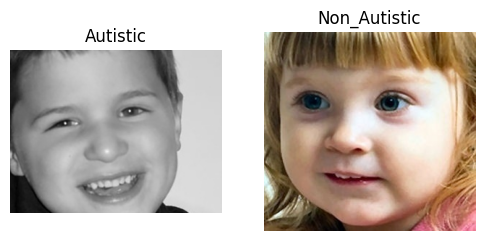

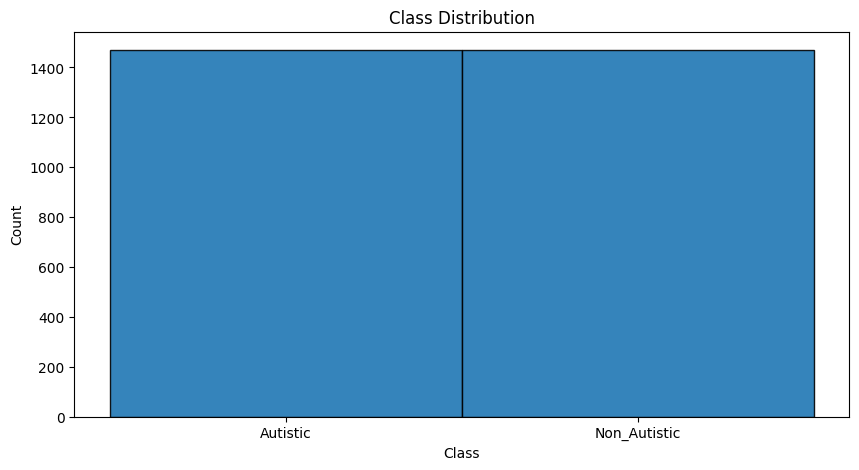

<Figure size 1000x500 with 0 Axes>

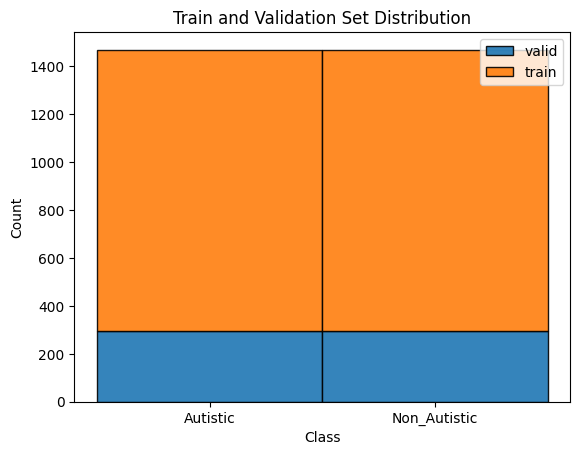

epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.914133,0.589871,0.251701,0.748299,00:11


epoch,train_loss,valid_loss,error_rate,accuracy,time
0,0.753642,0.526145,0.226190,0.773810,00:15
1,0.640283,0.492894,0.221088,0.778912,00:15
2,0.644404,0.487106,0.195578,0.804422,00:15
3,0.568611,0.476347,0.200680,0.799320,00:15
4,0.466924,0.439124,0.168367,0.831633,00:15
5,0.451867,0.483248,0.176871,0.823129,00:15
6,0.386948,0.512913,0.175170,0.824830,00:15
7,0.377541,0.494992,0.175170,0.824830,00:15
8,0.326320,0.505977,0.190476,0.809524,00:15
9,0.314369,0.448366,0.166667,0.833333,00:15


              precision    recall  f1-score   support

    Autistic       0.84      0.84      0.84       294
Non_Autistic       0.84      0.84      0.84       294

    accuracy                           0.84       588
   macro avg       0.84      0.84      0.84       588
weighted avg       0.84      0.84      0.84       588



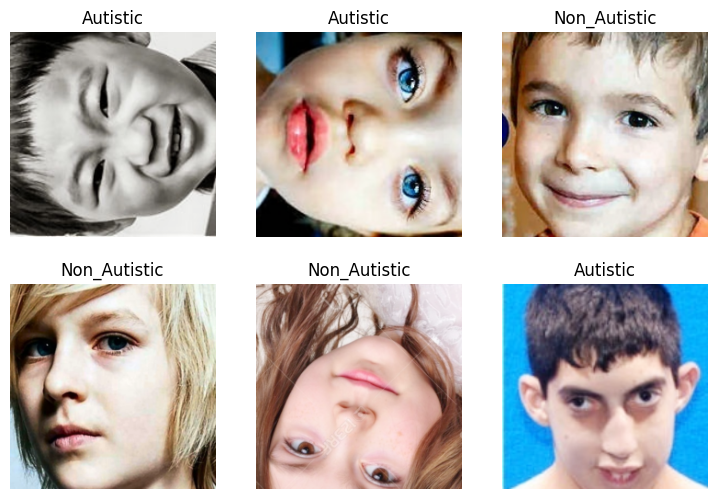

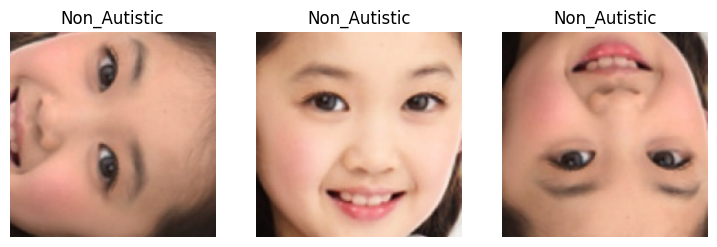

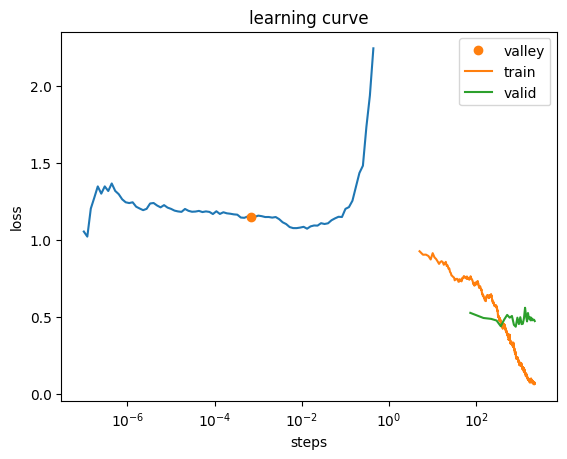

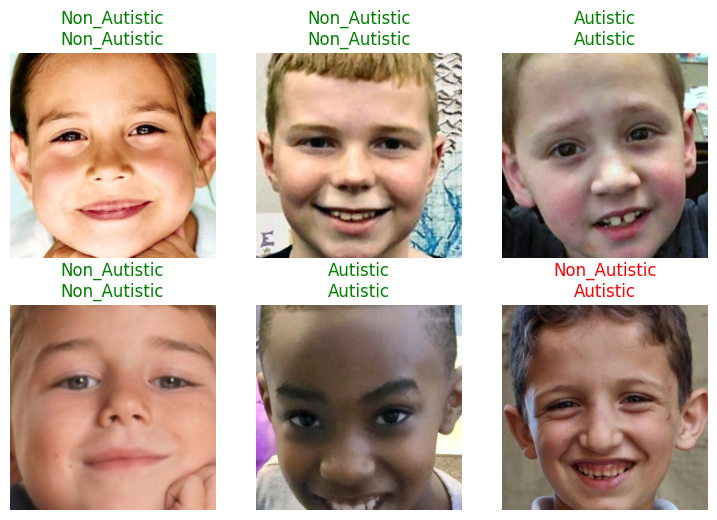

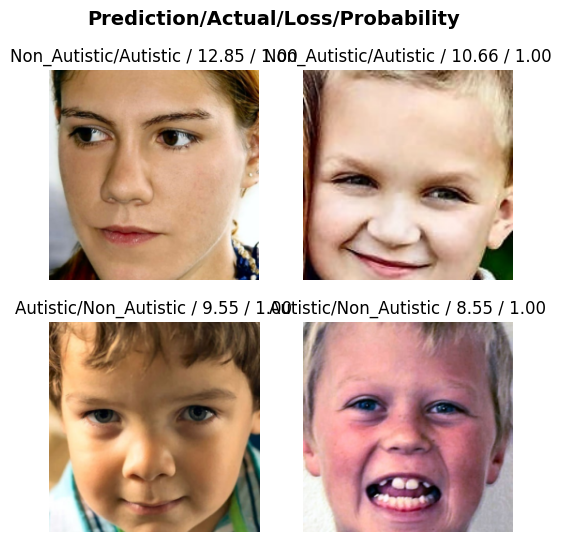

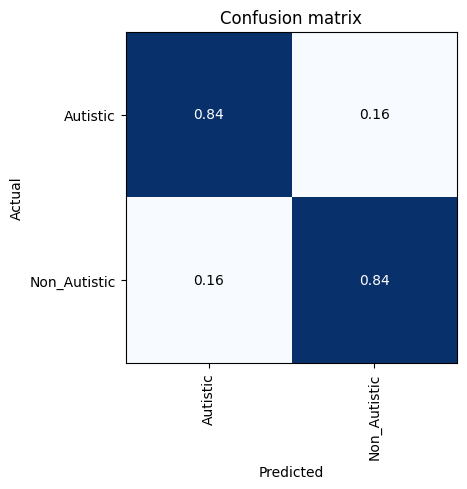

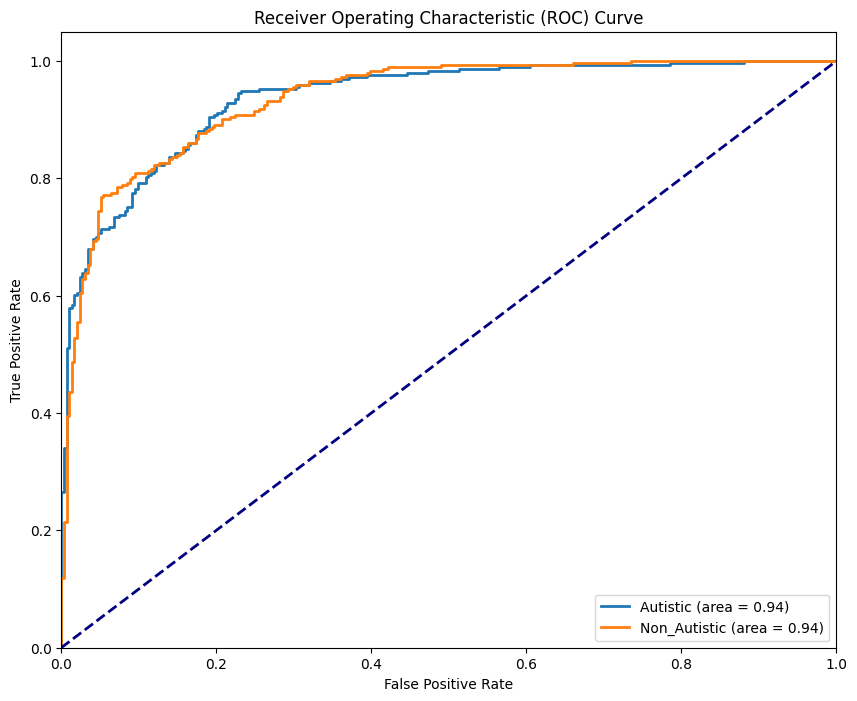

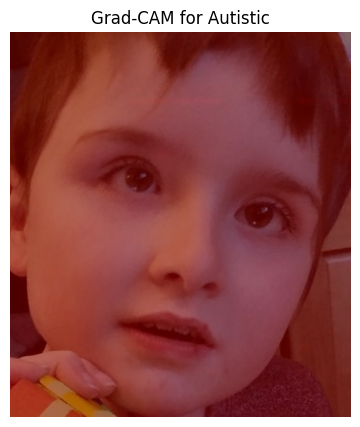

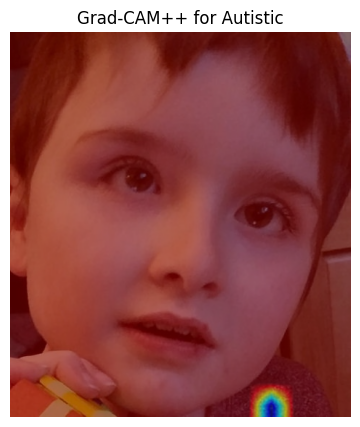

  0%|          | 0/1000 [00:00<?, ?it/s]

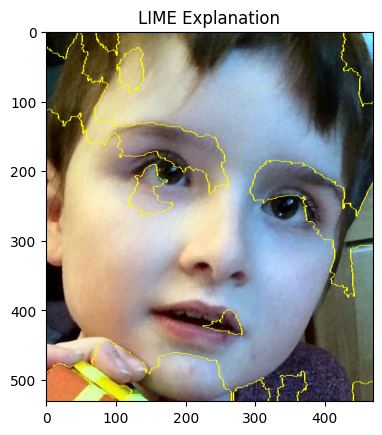

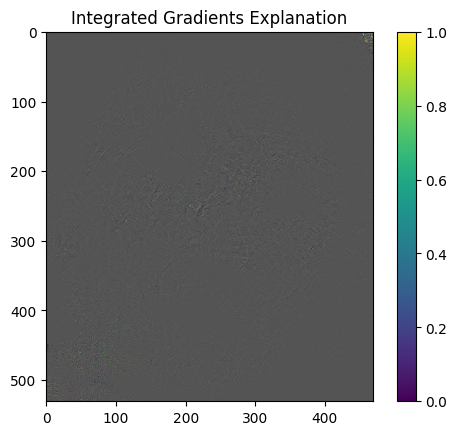

/opt/conda/lib/python3.10/site-packages/captum/_utils/gradient.py:57: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  warnings.warn(


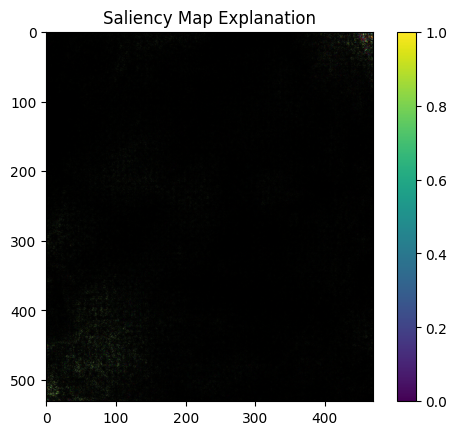

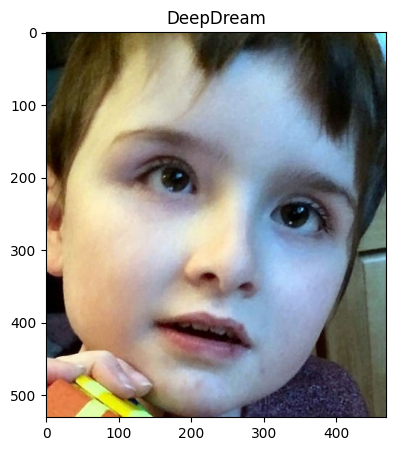

Category: Autistic


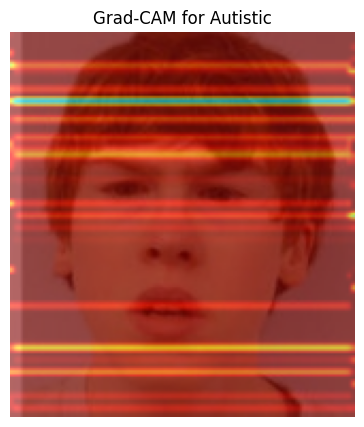

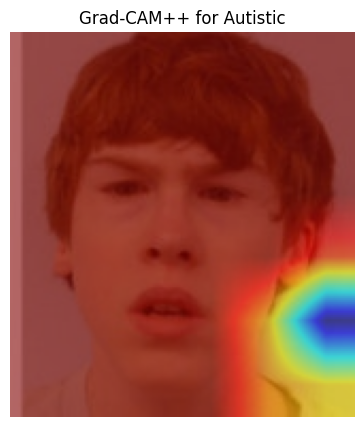

  0%|          | 0/1000 [00:00<?, ?it/s]

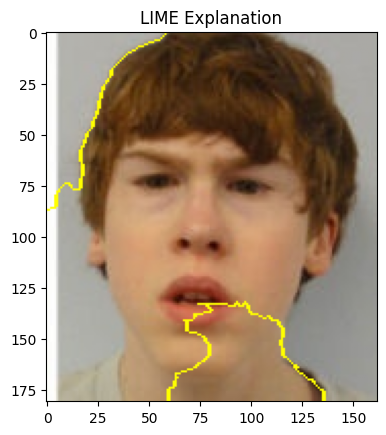

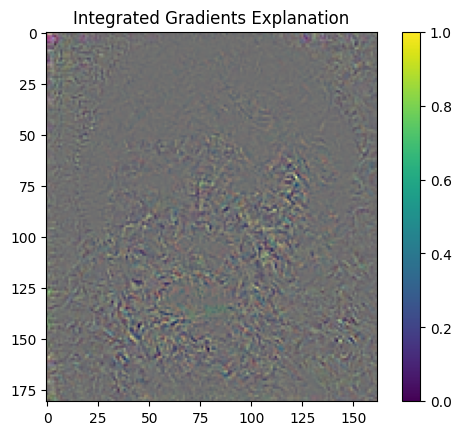

/opt/conda/lib/python3.10/site-packages/captum/_utils/gradient.py:57: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  warnings.warn(


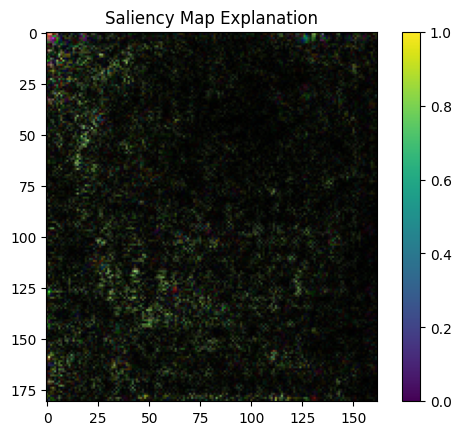

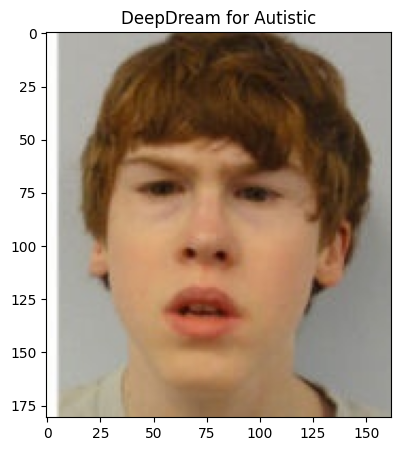

Category: Non_Autistic


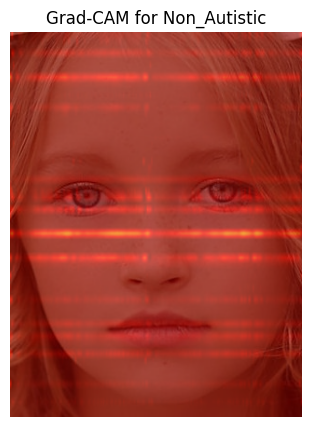

/tmp/ipykernel_34/3656182040.py:251: RuntimeWarning: invalid value encountered in divide
  gradcam_pp = gradcam_pp / gradcam_pp.max()
/tmp/ipykernel_34/3656182040.py:448: RuntimeWarning: invalid value encountered in cast
  heatmap_pp_resized = np.uint8(255 * heatmap_pp_resized)


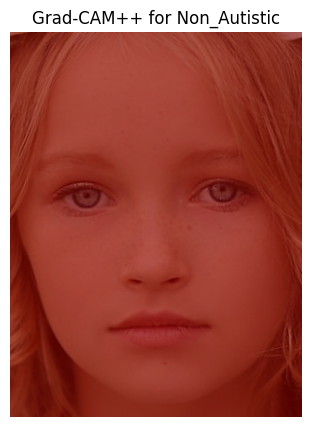

  0%|          | 0/1000 [00:00<?, ?it/s]

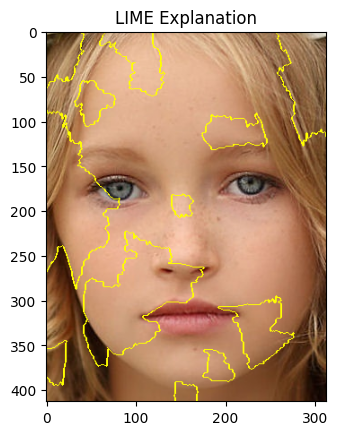

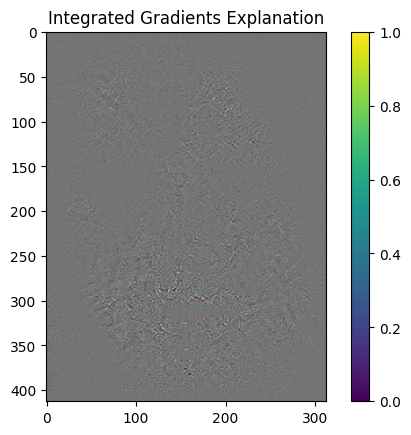

/opt/conda/lib/python3.10/site-packages/captum/_utils/gradient.py:57: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  warnings.warn(


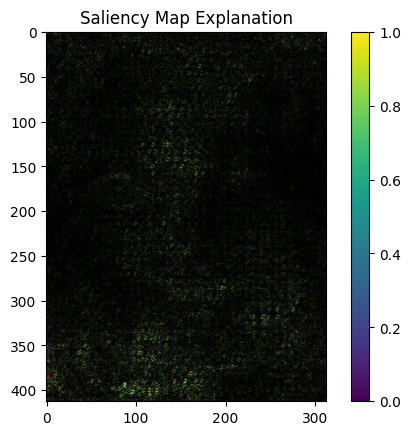

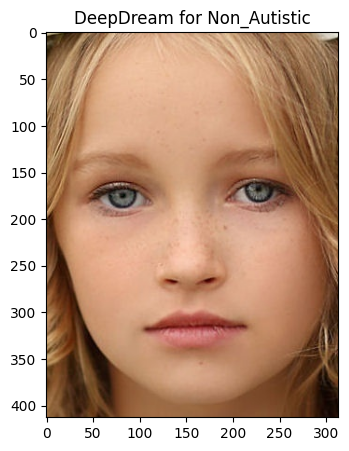

In [4]:
!pip install fastai captum

from fastai.vision.all import *
from sklearn.metrics import classification_report, roc_curve, auc
import matplotlib.pyplot as plt
from collections import Counter
import torch
import cv2
import numpy as np
import lime
from lime import lime_image
from captum.attr import Saliency, IntegratedGradients, visualization as viz
from skimage.segmentation import mark_boundaries
import torchvision.transforms as T

# Path to the dataset
data_path = Path('/kaggle/input/autism-dataset/dataset/consolidated')

# Load images
images = get_image_files(data_path)
print(f"No. of images: {len(images)}")

# Print image dimensions
sizes = set(Image.open(img).size for img in images)
print("Image Dimensions:", *sizes)

# Visualize some images
images = []
target = []
counts = []
for path in data_path.ls().sorted():
    target.append(path.name)  # class name is the name of the parent folder
    class_images = get_image_files(path)
    counts.append(len(class_images))
    img = random.choice(class_images)
    images.append(Image.open(img))

show_images(images, titles=target)
print("\n\n")

# Bar chart for class distribution
plt.figure(figsize=(10, 5))
plt.bar(target, counts, width=1, edgecolor='black', alpha=0.9)
plt.xlabel('Class')
plt.ylabel('Count')
plt.title('Class Distribution')
plt.show()
print("\n\n")

# Data block for loading the data
labels = [parent_label(img) for img in get_image_files(data_path)]
splitter = TrainTestSplitter(test_size=0.2, random_state=42, stratify=labels)
batch_transforms = aug_transforms(size=224, p_affine=0, max_warp=0, flip_vert=True)

dblock = DataBlock(
    blocks=(ImageBlock, CategoryBlock),
    get_items=get_image_files,
    splitter=splitter,
    get_y=parent_label,
    item_tfms=Resize(224),
    batch_tfms=batch_transforms
)

dls = dblock.dataloaders(data_path, batch_size=32)

# Check distributions of train and validation set
train_labels = sorted(parent_label(x) for x in dls.train.items)
valid_labels = sorted(parent_label(x) for x in dls.valid.items)
ntrain = list(Counter(train_labels).values())
nvalid = list(Counter(valid_labels).values())

plt.figure(figsize=(10, 5))
ax = plt.subplots()[1]
ax.bar(target, nvalid, width=1, edgecolor='black', alpha=0.9, label='valid')
ax.bar(target, ntrain, width=1, edgecolor='black', alpha=0.9, label='train', bottom=nvalid)
plt.xlabel('Class')
plt.ylabel('Count')
plt.legend()
plt.title('Train and Validation Set Distribution')
plt.show()
print("\n\n")

# Show batch of images
dls.show_batch(max_n=6, nrows=2)
dls.show_batch(max_n=3, nrows=1, unique=True)
print("\n\n")

# Create a learner
learn = vision_learner(dls, resnet34, metrics=[error_rate, accuracy])

# Find learning rate and fine-tune the model
learn.lr_find()
print("\n\n")
learn.fine_tune(30, 0.001)

# Plot learning curve
learn.recorder.plot_loss()
print("\n\n")

# Show results
learn.show_results(max_n=6, nrows=2)

# Plot top losses
interp = Interpretation.from_learner(learn)
interp.plot_top_losses(4)
print("\n\n")

# Show confusion matrix of predictions on the validation set
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix(normalize=True)
print("\n\n")

# Generate classification report
preds, y_true = learn.get_preds()
y_pred = preds.argmax(dim=1).numpy()
y_true = y_true.numpy()
y_pred_labels = [dls.vocab[idx] for idx in y_pred]
y_true_labels = [dls.vocab[idx] for idx in y_true]
report = classification_report(y_true_labels, y_pred_labels, target_names=dls.vocab)
print(report)

# ROC Curve
fpr = {}
tpr = {}
roc_auc = {}

for i, label in enumerate(dls.vocab):
    fpr[label], tpr[label], _ = roc_curve(y_true == i, preds[:, i])
    roc_auc[label] = auc(fpr[label], tpr[label])

plt.figure(figsize=(10, 8))
for label in dls.vocab:
    plt.plot(fpr[label], tpr[label], lw=2, label=f'{label} (area = {roc_auc[label]:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

def generate_gradcam(learn, img, cls_idx):
    learn.model.eval()
    img = img.unsqueeze(0).to(next(learn.model.parameters()).device)  # Ensure image tensor is on the same device as model

    def hooked_backward(mod, grad_in, grad_out):
        global activations
        activations = grad_out[0]
    
    def hooked_forward(mod, input, output):
        global hook_a
        hook_a = output
    
    for module in learn.model[0]:
        if isinstance(module, torch.nn.modules.conv.Conv2d):
            hook = module.register_forward_hook(hooked_forward)
            grad = module.register_full_backward_hook(hooked_backward)
    
    learn.model.zero_grad()
    out = learn.model(img)
    out[0, cls_idx].backward()

    weights = activations.mean(dim=[1, 2], keepdim=True)
    gradcam = (hook_a * weights).sum(0)
    gradcam = torch.clamp(gradcam, min=0)
    gradcam /= gradcam.max()
    gradcam = gradcam.detach().cpu().numpy()

    grad.remove()
    hook.remove()

    return gradcam

# Test Grad-CAM on validation set images
img, label = dls.valid_ds[0]
img_tensor = tensor(img).float()
img_tensor = img_tensor.permute(2, 0, 1)
cls_idx = int(label)
gradcam = generate_gradcam(learn, img_tensor.cuda(), cls_idx)

# Resize Grad-CAM heatmap to match image dimensions
heatmap_resized = cv2.resize(gradcam, (img_tensor.shape[1], img_tensor.shape[2]))

# Normalize the heatmap
heatmap_resized = np.uint8(255 * heatmap_resized)

# Ensure heatmap is 2D
if len(heatmap_resized.shape) == 3:
    heatmap_resized = heatmap_resized[:,:,0]

# Apply the color map
heatmap_resized = cv2.applyColorMap(heatmap_resized, cv2.COLORMAP_JET)

# Convert PIL image to numpy array
img = np.array(img)

# Ensure the heatmap and the image have the same number of channels
if img.shape[2] == 4:  # If image is RGBA
    img = cv2.cvtColor(img, cv2.COLOR_RGBA2RGB)

# Ensure the image and the heatmap have the same dimensions
heatmap_resized = cv2.resize(heatmap_resized, (img.shape[1], img.shape[0]))

# Deeply highlight the gradient region
overlay = cv2.addWeighted(img, 0.4, heatmap_resized, 0.6, 0)

# Display Grad-CAM
plt.figure(figsize=(10, 5))
plt.imshow(overlay)
plt.title(f'Grad-CAM for {dls.vocab[cls_idx]}')
plt.axis('off')
plt.show()

# Grad-CAM++
def generate_gradcam_pp(learn, img, cls_idx):
    learn.model.eval()
    device = next(learn.model.parameters()).device  # Get the device of the model

    # Ensure image tensor is on the same device as model
    img = img.unsqueeze(0).to(device)
    
    activations = None
    gradients = None

    def hooked_backward(module, grad_in, grad_out):
        nonlocal gradients
        gradients = grad_in[0]

    def hooked_forward(module, input, output):
        nonlocal activations
        activations = output

    # Find the last convolutional layer and register hooks
    for module in reversed(list(learn.model.modules())):
        if isinstance(module, torch.nn.Conv2d):
            hook_a = module.register_forward_hook(hooked_forward)
            hook_g = module.register_full_backward_hook(hooked_backward)
            break

    # Perform forward and backward pass
    output = learn.model(img)
    learn.model.zero_grad()
    score = output[0, cls_idx]
    score.backward(retain_graph=True)

    # Compute Grad-CAM++
    weights = gradients.pow(2)
    alpha = weights / (weights.sum(dim=(2, 3), keepdim=True) + 1e-7)
    gradcam_pp = (alpha * activations).sum(dim=1, keepdim=True).relu().squeeze().detach().cpu().numpy()
    gradcam_pp = gradcam_pp / gradcam_pp.max()

    # Remove hooks
    hook_a.remove()
    hook_g.remove()

    return gradcam_pp

# Test Grad-CAM++ on validation set images
gradcam_pp = generate_gradcam_pp(learn, img_tensor.cuda(), cls_idx)

# Resize Grad-CAM++ heatmap to match image dimensions
heatmap_pp_resized = cv2.resize(gradcam_pp, (img_tensor.shape[1], img_tensor.shape[2]))

# Normalize the heatmap
heatmap_pp_resized = np.uint8(255 * heatmap_pp_resized)

# Ensure heatmap is 2D
if len(heatmap_pp_resized.shape) == 3:
    heatmap_pp_resized = heatmap_pp_resized[:,:,0]

# Apply the color map
heatmap_pp_resized = cv2.applyColorMap(heatmap_pp_resized, cv2.COLORMAP_JET)

# Ensure the image and the heatmap have the same dimensions
heatmap_pp_resized = cv2.resize(heatmap_pp_resized, (img.shape[1], img.shape[0]))

# Deeply highlight the gradient region
overlay_pp = cv2.addWeighted(img, 0.4, heatmap_pp_resized, 0.6, 0)

# Display Grad-CAM++
plt.figure(figsize=(10, 5))
plt.imshow(overlay_pp)
plt.title(f'Grad-CAM++ for {dls.vocab[cls_idx]}')
plt.axis('off')
plt.show()


def lime_explanation(img):
    def predict(images):
        images = torch.stack([vision_transform(im) for im in images])
        preds = learn.model(images.cuda())
        return preds.softmax(dim=1).cpu().detach().numpy()
    
    explainer = lime_image.LimeImageExplainer()
    explanation = explainer.explain_instance(np.array(img), predict, top_labels=1, hide_color=0, num_samples=1000)

    temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], positive_only=True, num_features=30, hide_rest=False)
    plt.imshow(mark_boundaries(temp, mask))
    plt.title('LIME Explanation')
    plt.show()

# Vision transform to convert PIL image to tensor
def vision_transform(img):
    transform = T.ToTensor()
    return transform(img)

# Test LIME explanation
lime_explanation(img)

def integrated_gradients_explanation(learn, img_tensor):
    img_tensor = img_tensor.unsqueeze(0).cuda()  # Ensure tensor is on GPU
    ig = IntegratedGradients(learn.model)
    
    # Baseline is a black image (all zeros)
    baselines = img_tensor * 0
    
    # Compute attributions
    attributions = ig.attribute(img_tensor, target=cls_idx, baselines=baselines)
    
    # Convert attributions to numpy array
    attr_np = attributions.squeeze().detach().cpu().numpy().transpose(1, 2, 0)

    # Normalize attributions for visualization
    attr_np = (attr_np - attr_np.min()) / (attr_np.max() - attr_np.min())

    # Display attributions
    plt.imshow(attr_np, cmap='viridis')
    plt.title('Integrated Gradients Explanation')
    plt.colorbar()
    plt.show()

# Example call to the function with 'learn' as the model and 'img_tensor' as the input image tensor
img, label = dls.valid_ds[0]
img_tensor = tensor(img).float()  # Convert PIL image to PyTorch tensor
img_tensor = img_tensor.permute(2, 0, 1)  # Permute dimensions to match expected input shape
integrated_gradients_explanation(learn, img_tensor)

def saliency_map_explanation(learn, img_tensor):
    img_tensor = img_tensor.unsqueeze(0).cuda()  # Ensure tensor is on GPU
    saliency = Saliency(learn.model)
    
    # Compute attributions
    attributions = saliency.attribute(img_tensor, target=cls_idx)
    
    # Convert attributions to numpy array
    attr_np = attributions.squeeze().detach().cpu().numpy().transpose(1, 2, 0)

    # Normalize attributions for visualization
    attr_np = (attr_np - attr_np.min()) / (attr_np.max() - attr_np.min())

    # Display attributions
    plt.imshow(attr_np, cmap='viridis')
    plt.title('Saliency Map Explanation')
    plt.colorbar()
    plt.show()

# Example call to the function with 'learn' as the model and 'img_tensor' as the input image tensor
img, label = dls.valid_ds[0]
img_tensor = tensor(img).float()  # Convert PIL image to PyTorch tensor
img_tensor = img_tensor.permute(2, 0, 1)  # Permute dimensions to match expected input shape
saliency_map_explanation(learn, img_tensor)


# DeepDream implementation
def deepdream(img_tensor, model, iterations, lr):
    model.eval()
    img_tensor = img_tensor.unsqueeze(0).to(next(model.parameters()).device)  # Ensure tensor is on the same device as model
    img_tensor.requires_grad = True

    for i in range(iterations):
        model.zero_grad()
        out = model(img_tensor)
        loss = out.norm()
        loss.backward()
        img_tensor.data += lr * img_tensor.grad.data
        img_tensor.grad.data.zero_()

    # Deeply highlight the regions
    deepdream_img = img_tensor.squeeze().detach().cpu().numpy().transpose(1, 2, 0)
    deepdream_img = (deepdream_img - deepdream_img.min()) / (deepdream_img.max() - deepdream_img.min())
    
    return deepdream_img

# Test DeepDream on validation set image
deepdream_img = deepdream(img_tensor, learn.model, iterations=10, lr=0.01)

# Display DeepDream result
plt.figure(figsize=(10, 5))
plt.imshow(deepdream_img)
plt.title('DeepDream')
plt.show()

# Apply interpretability techniques on an image from each category
for category in target:
    print(f"Category: {category}")
    class_images = get_image_files(data_path/category)
    img_path = random.choice(class_images)
    img = Image.open(img_path)
    img_tensor = tensor(img).float()  # Convert PIL image to PyTorch tensor
    img_tensor = img_tensor.permute(2, 0, 1)  # Permute dimensions to match expected input shape

    # Grad-CAM
    cls_idx = dls.vocab.o2i[category]  # Correct way to get the index of the category
    gradcam = generate_gradcam(learn, img_tensor.cuda(), cls_idx)

    # Resize Grad-CAM heatmap to match image dimensions
    heatmap_resized = cv2.resize(gradcam, (img_tensor.shape[1], img_tensor.shape[2]))

    # Normalize the heatmap
    heatmap_resized = np.uint8(255 * heatmap_resized)

    # Ensure heatmap is 2D
    if len(heatmap_resized.shape) == 3:
        heatmap_resized = heatmap_resized[:,:,0]

    # Apply the color map
    heatmap_resized = cv2.applyColorMap(heatmap_resized, cv2.COLORMAP_JET)

    # Convert PIL image to numpy array
    img = np.array(img)

    # Ensure the heatmap and the image have the same number of channels
    if img.shape[2] == 4:  # If image is RGBA
        img = cv2.cvtColor(img, cv2.COLOR_RGBA2RGB)

    # Ensure the image and the heatmap have the same dimensions
    heatmap_resized = cv2.resize(heatmap_resized, (img.shape[1], img.shape[0]))

    # Deeply highlight the gradient region
    overlay = cv2.addWeighted(img, 0.4, heatmap_resized, 0.6, 0)

    # Display Grad-CAM
    plt.figure(figsize=(10, 5))
    plt.imshow(overlay)
    plt.title(f'Grad-CAM for {dls.vocab[cls_idx]}')
    plt.axis('off')
    plt.show()

    #GradCam+++
    # Test Grad-CAM++ on validation set images
    gradcam_pp = generate_gradcam_pp(learn, img_tensor.cuda(), cls_idx)

    # Resize Grad-CAM++ heatmap to match image dimensions
    heatmap_pp_resized = cv2.resize(gradcam_pp, (img_tensor.shape[1], img_tensor.shape[2]))

    # Normalize the heatmap
    heatmap_pp_resized = np.uint8(255 * heatmap_pp_resized)

    # Ensure heatmap is 2D
    if len(heatmap_pp_resized.shape) == 3:
        heatmap_pp_resized = heatmap_pp_resized[:,:,0]

    # Apply the color map
    heatmap_pp_resized = cv2.applyColorMap(heatmap_pp_resized, cv2.COLORMAP_JET)

    # Ensure the image and the heatmap have the same dimensions
    heatmap_pp_resized = cv2.resize(heatmap_pp_resized, (img.shape[1], img.shape[0]))

    # Deeply highlight the gradient region
    overlay_pp = cv2.addWeighted(img, 0.4, heatmap_pp_resized, 0.6, 0)

    # Display Grad-CAM++
    plt.figure(figsize=(10, 5))
    plt.imshow(overlay_pp)
    plt.title(f'Grad-CAM++ for {dls.vocab[cls_idx]}')
    plt.axis('off')
    plt.show()

    # LIME
    lime_explanation(img)

    # Integrated Gradients
    integrated_gradients_explanation(learn, img_tensor)

    # Saliency Map
    saliency_map_explanation(learn, img_tensor)
    
    # DeepDream
    deepdream_img = deepdream(img_tensor, learn.model, iterations=10, lr=0.01)
    plt.figure(figsize=(10, 5))
    plt.imshow(deepdream_img)
    plt.title(f'DeepDream for {category}')
    plt.show()
